## **Cardiovascular Heart Diseace Prediction**

##**Data Description**
###**Demographic:**
###• Sex: male or female("M" or "F")
###• Age: Age of the patient;(Continuous - Although the recorded ages have been truncated to whole numbers, the concept of age is continuous)
###**Behavioral:**
###• is_smoking: whether or not the patient is a current smoker ("YES" or "NO")
###• Cigs Per Day: the number of cigarettes that the person smoked on average in one day.(can be considered continuous as one can have any number of cigarettes, even half a cigarette.)
###**Medical( history):**
###• BP Meds: whether or not the patient was on blood pressure medication (Nominal)
###• Prevalent Stroke: whether or not the patient had previously had a stroke (Nominal)
###• Prevalent Hyp: whether or not the patient was hypertensive (Nominal)
###• Diabetes: whether or not the patient had diabetes (Nominal)
### **Medical(current):**
###• Tot Chol: total cholesterol level (Continuous)
###• Sys BP: systolic blood pressure (Continuous)
###• Dia BP: diastolic blood pressure (Continuous)
###• BMI: Body Mass Index (Continuous)
###• Heart Rate: heart rate (Continuous - In medical research, variables such as heart rate though infact discrete, yet are considered continuous because of large number of possible values.)
###• Glucose: glucose level (Continuous)

###**Predict variable (desired target)**
###• 10-year risk of coronary heart disease CHD(binary: “1”, means “Yes”, “0” means “No”) - DV

In [3]:
import warnings
warnings.filterwarnings('ignore')

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing  import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline
from sklearn.decomposition import PCA

from sklearn.metrics import confusion_matrix, accuracy_score, roc_auc_score, classification_report
from sklearn.metrics import plot_confusion_matrix, plot_precision_recall_curve, plot_roc_curve

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB

from sklearn.ensemble import GradientBoostingClassifier
import xgboost as xgb
from sklearn import tree
from sklearn import ensemble
from collections import Counter

%matplotlib inline

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
df = pd.read_csv('/content/data_cardiovascular_risk.csv')

In [ ]:
df

,id,age,education,sex,is_smoking,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,TenYearCHD
0,0,64,2.0,F,YES,3.0,0.0,0,0,0,221.0,148.0,85.0,NaN,90.0,80.0,1
1,1,36,4.0,M,NO,0.0,0.0,0,1,0,212.0,168.0,98.0,29.77,72.0,75.0,0
2,2,46,1.0,F,YES,10.0,0.0,0,0,0,250.0,116.0,71.0,20.35,88.0,94.0,0
3,3,50,1.0,M,YES,20.0,0.0,0,1,0,233.0,158.0,88.0,28.26,68.0,94.0,1
4,4,64,1.0,F,YES,30.0,0.0,0,0,0,241.0,136.5,85.0,26.42,70.0,77.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3385,3385,60,1.0,F,NO,0.0,0.0,0,0,0,261.0,123.5,79.0,29.28,70.0,103.0,0
3386,3386,46,1.0,F,NO,0.0,0.0,0,0,0,199.0,102.0,56.0,21.96,80.0,84.0,0
3387,3387,44,3.0,M,YES,3.0,0.0,0,1,0,352.0,164.0,119.0,28.92,73.0,72.0,1
3388,3388,60,1.0,M,NO,0.0,NaN,0,1,0,191.0,167.0,105.0,23.01,80.0,85.0,0


In [ ]:
train_df = df.copy()

In [ ]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3390 entries, 0 to 3389
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               3390 non-null   int64  
 1   age              3390 non-null   int64  
 2   education        3303 non-null   float64
 3   sex              3390 non-null   object 
 4   is_smoking       3390 non-null   object 
 5   cigsPerDay       3368 non-null   float64
 6   BPMeds           3346 non-null   float64
 7   prevalentStroke  3390 non-null   int64  
 8   prevalentHyp     3390 non-null   int64  
 9   diabetes         3390 non-null   int64  
 10  totChol          3352 non-null   float64
 11  sysBP            3390 non-null   float64
 12  diaBP            3390 non-null   float64
 13  BMI              3376 non-null   float64
 14  heartRate        3389 non-null   float64
 15  glucose          3086 non-null   float64
 16  TenYearCHD       3390 non-null   int64  
dtypes: float64(9),

In [ ]:
train_df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
id,3390.0,NaN,NaN,NaN,1694.5,978.753033,0.0,847.25,1694.5,2541.75,3389.0
age,3390.0,NaN,NaN,NaN,49.542183,8.592878,32.0,42.0,49.0,56.0,70.0
education,3303.0,NaN,NaN,NaN,1.970936,1.019081,1.0,1.0,2.0,3.0,4.0
sex,3390,2,F,1923,NaN,NaN,NaN,NaN,NaN,NaN,NaN
is_smoking,3390,2,NO,1703,NaN,NaN,NaN,NaN,NaN,NaN,NaN
cigsPerDay,3368.0,NaN,NaN,NaN,9.069477,11.879078,0.0,0.0,0.0,20.0,70.0
BPMeds,3346.0,NaN,NaN,NaN,0.029886,0.170299,0.0,0.0,0.0,0.0,1.0
prevalentStroke,3390.0,NaN,NaN,NaN,0.00649,0.080309,0.0,0.0,0.0,0.0,1.0
prevalentHyp,3390.0,NaN,NaN,NaN,0.315339,0.464719,0.0,0.0,0.0,1.0,1.0
diabetes,3390.0,NaN,NaN,NaN,0.025664,0.158153,0.0,0.0,0.0,0.0,1.0


In [ ]:
#as we can see there is 3390 rows and 17 columns with different medical data like is person smoker,
#how many cigs per day, is he on bp meds or not
# this dataset contains some missing values and some categorical values 

In [ ]:
# most machine learning algorithms cannot handle categorical data very well 
# so we need to know what categorical data our dataset contains 

In [ ]:
# Value counts of the categorical and numerical features 
for i in df.columns:
  print({i:df[i].nunique()})

{'id': 3390}
{'age': 39}
{'education': 4}
{'sex': 2}
{'is_smoking': 2}
{'cigsPerDay': 32}
{'BPMeds': 2}
{'prevalentStroke': 2}
{'prevalentHyp': 2}
{'diabetes': 2}
{'totChol': 240}
{'sysBP': 226}
{'diaBP': 142}
{'BMI': 1259}
{'heartRate': 68}
{'glucose': 132}
{'TenYearCHD': 2}


In [ ]:
#defining numeric and categorical column to treat null values based on that
categorical_columns = ['education','sex','is_smoking','BPMeds','prevalentStroke','prevalentHyp','diabetes','TenYearCHD']
numerical_columns = ['cigsPerDay','age','totChol','sysBP','diaBP','BMI','heartRate','glucose']

In [ ]:
#checking the categories in each categorical column
for i in categorical_columns:
    print(i,df[i].value_counts().reset_index(),"\n")

education    index  education
0    1.0       1391
1    2.0        990
2    3.0        549
3    4.0        373 

sex   index   sex
0     F  1923
1     M  1467 

is_smoking   index  is_smoking
0    NO        1703
1   YES        1687 

BPMeds    index  BPMeds
0    0.0    3246
1    1.0     100 

prevalentStroke    index  prevalentStroke
0      0             3368
1      1               22 

prevalentHyp    index  prevalentHyp
0      0          2321
1      1          1069 

diabetes    index  diabetes
0      0      3303
1      1        87 

TenYearCHD    index  TenYearCHD
0      0        2879
1      1         511 



In [ ]:
# in binary "1" means "yes" and "0" means "no"
# in Ten year CHD 2879 parient out of 3890 are in "0" class and rest are in "1" class 

In [ ]:
#EDA 

Imported v0.1.58. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine
Shape of your Data Set loaded: (3390, 17)
#######################################################################################
######################## C L A S S 

,Nuniques,dtype,Nulls,Nullpercent,NuniquePercent,Value counts Min,Data cleaning improvement suggestions
id,3390,int64,0,0.000000,100.000000,0,possible ID column: drop
BMI,1259,float64,14,0.412979,37.138643,0,fill missing
totChol,240,float64,38,1.120944,7.079646,0,fill missing
sysBP,226,float64,0,0.000000,6.666667,0,skewed: cap or drop outliers
diaBP,142,float64,0,0.000000,4.188791,0,
glucose,132,float64,304,8.967552,3.893805,0,"fill missing, highly skewed: drop outliers or do box-cox transform"
heartRate,68,float64,1,0.029499,2.005900,0,fill missing
age,39,int64,0,0.000000,1.150442,0,
cigsPerDay,32,float64,22,0.648968,0.943953,0,"fill missing, skewed: cap or drop outliers"
education,4,float64,87,2.566372,0.117994,0,fill missing


    17 Predictors classified...
        1 variables removed since they were ID or low-information variables
        List of variables removed: ['id']
Number of All Scatter Plots = 36
All Plots done
Time to run AutoViz = 11 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


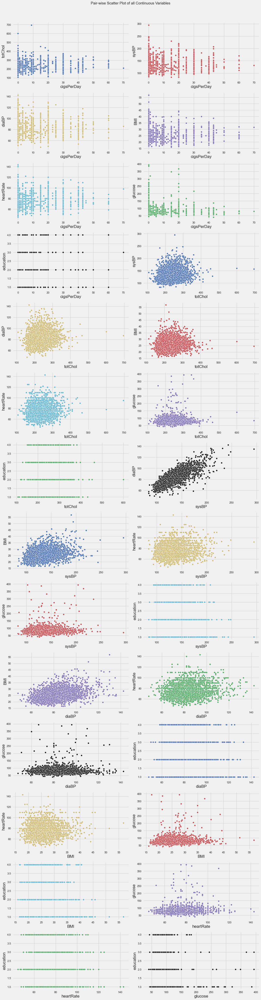

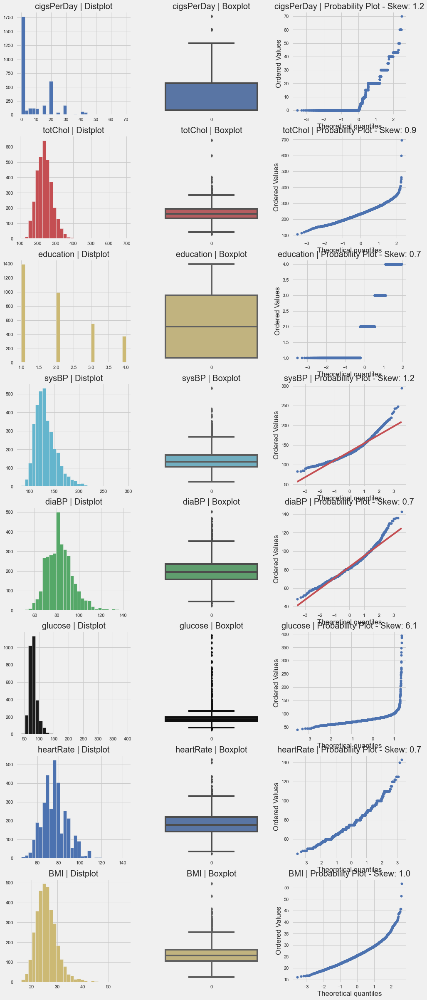

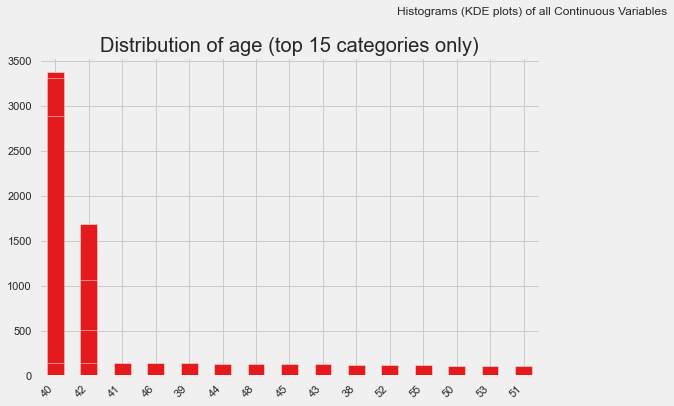

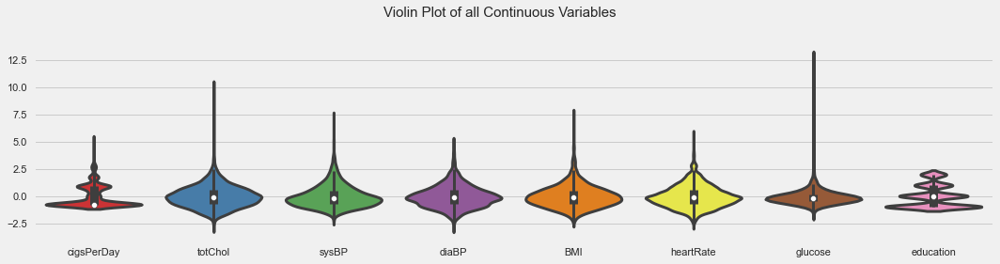

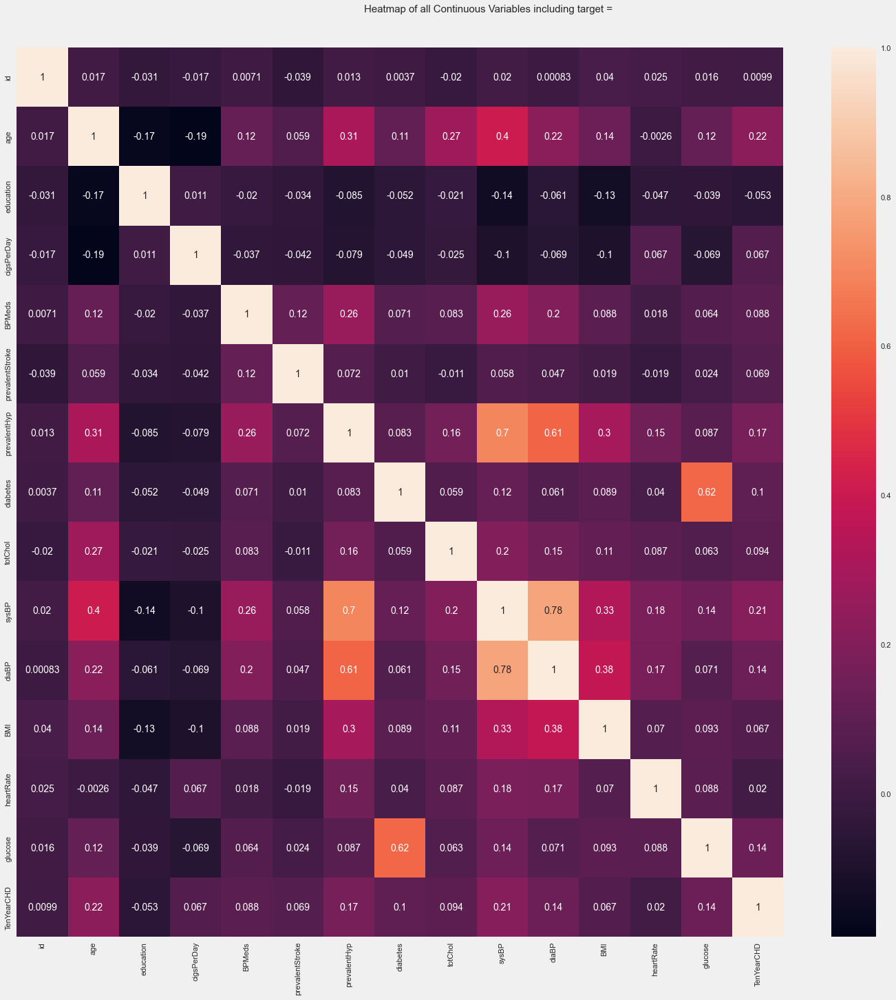

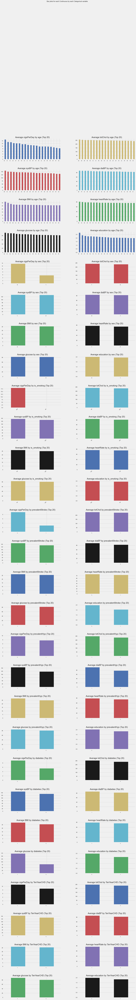

In [ ]:
#using autooviz library to get more insight from data 

from autoviz.AutoViz_Class import AutoViz_Class
AV = AutoViz_Class()
df = AV.AutoViz('E:\\# DATA SCIENCE\\CApstone project\\cardiovascular risk prediction\\data_cardiovascular_risk.csv')

In [ ]:
# missing values in dataset
train_df.isna().sum()

id                   0
age                  0
education           87
sex                  0
is_smoking           0
cigsPerDay          22
BPMeds              44
prevalentStroke      0
prevalentHyp         0
diabetes             0
totChol             38
sysBP                0
diaBP                0
BMI                 14
heartRate            1
glucose            304
TenYearCHD           0
dtype: int64

<AxesSubplot: >

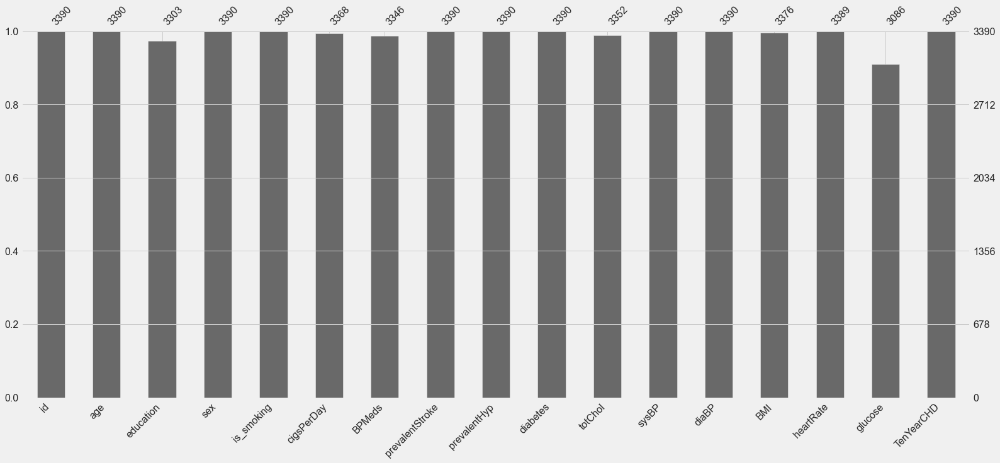

In [ ]:
# to visualize missing data 
import missingno as msno
msno.bar(train_df)

In [ ]:
# as we can see the most missing data available in Gluscose, CigsPerDay, BPmeds, Glucose, 
# to deal with missing values i decided to go with 2 ways and at last i will check which method gives me best output
# First method is to fill missing values with mean values 
# second method is to go with Hist Gradient Boosting Classifier this model deals with missing values 

# Dealing with Missing data 
## 1. By filling with mean values 

In [ ]:
train_df1 = train_df.copy()

In [ ]:
#as we seen above there are very few missing values in columns except in glucose values, so droping other columns except glucose 
train_df1.dropna(subset = ['education','cigsPerDay','BPMeds','totChol','heartRate','BMI'], inplace = True)


In [ ]:
# as for glucose vaue we just use mean values in missing data 
mean = train_df1['glucose'].mean()
train_df1['glucose'].fillna(mean,inplace = True)

In [ ]:
train_df1.isna().sum()

id                 0
age                0
education          0
sex                0
is_smoking         0
cigsPerDay         0
BPMeds             0
prevalentStroke    0
prevalentHyp       0
diabetes           0
totChol            0
sysBP              0
diaBP              0
BMI                0
heartRate          0
glucose            0
TenYearCHD         0
dtype: int64

# Finding correalation in Dataset 

<AxesSubplot: >

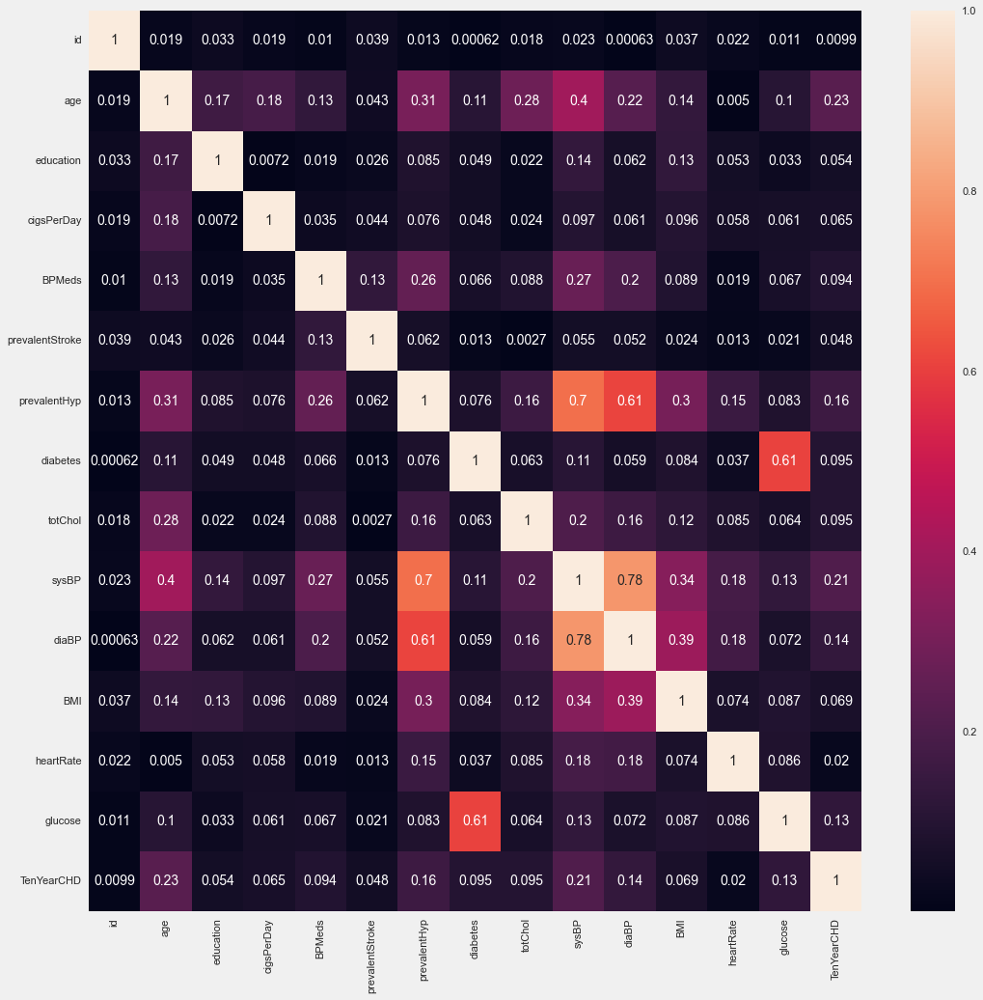

In [ ]:
# Plotting the correlation matrix using heatmap
plt.figure(figsize=(16,16))
correlation = train_df1.corr()
sns.heatmap(abs(correlation), annot=True)

In [ ]:
# There is no significance correlation between variables 

# Finding outliers 

<AxesSubplot: >

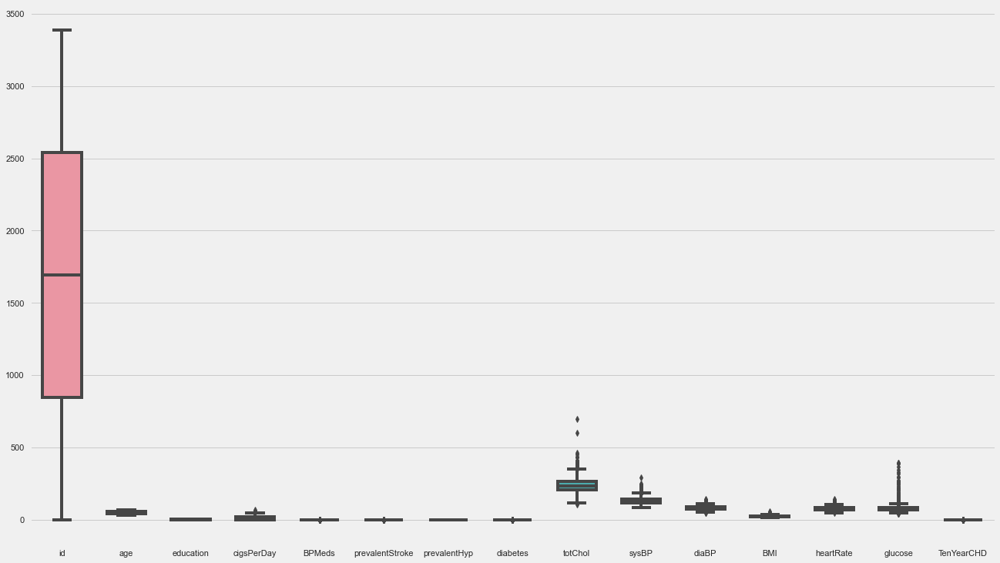

In [ ]:
fig, ax = plt.subplots(figsize=(20,12))
sns.boxplot(data = train_df, width= 0.6)

There are outliers but within the possible range of values.


# Understanding the distribution Feature 
#Analysing data through pie chart 

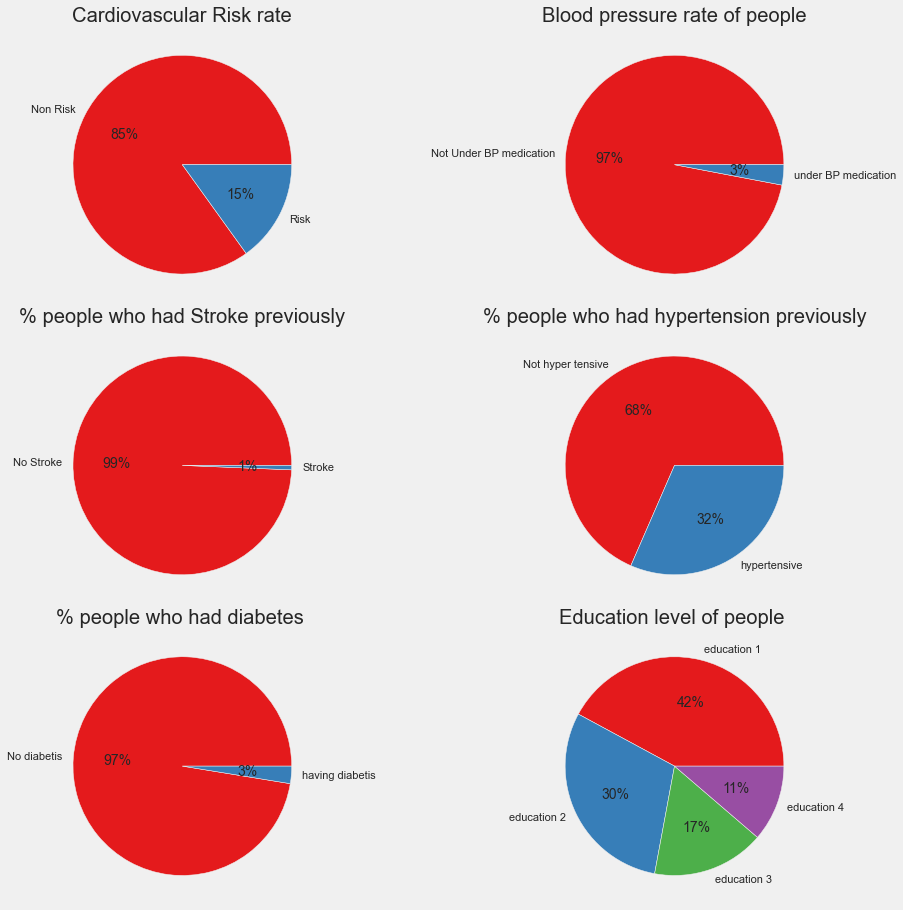

In [ ]:
fig, ax = plt.subplots(figsize = (15, 15))

plt.subplot(3,2,1)
labels = 'Non Risk',"Risk"
plt.pie(df['TenYearCHD'].value_counts(), labels=labels ,autopct='%1.0f%%')
plt.title("Cardiovascular Risk rate")

plt.subplot(3,2,2)
labels = 'Not Under BP medication',"under BP medication"
plt.pie(df['BPMeds'].value_counts(), labels=labels ,autopct='%1.0f%%')
plt.title("Blood pressure rate of people")

plt.subplot(3,2,3)
labels = 'No Stroke','Stroke'
plt.pie(df['prevalentStroke'].value_counts(), labels=labels ,autopct='%1.0f%%')
plt.title("% people who had Stroke previously")

plt.subplot(3,2,4)
labels = 'Not hyper tensive','hypertensive'
plt.pie(df['prevalentHyp'].value_counts(), labels=labels ,autopct='%1.0f%%')
plt.title("% people who had hypertension previously")

plt.subplot(3,2,5)
labels = 'No diabetis','having diabetis'
plt.pie(df['diabetes'].value_counts(), labels=labels ,autopct='%1.0f%%')
plt.title("% people who had diabetes ")

plt.subplot(3,2,6)
labels = 'education 1','education 2','education 3','education 4'
plt.pie(df['education'].value_counts(), labels=labels ,autopct='%1.0f%%')
plt.title("Education level of people ")

plt.subplots_adjust(hspace= 0.1, wspace= 0.1)
plt.show()

**Now, we can conclude that,**

(1) There are 85% of people are actually not at risk of Cardio Vascular Risk.

(2) There are only 3% of people who are under BP medication.

(3) There are only 1% of people who had stroke previously.

(4) There are 32% of people who are having Hyper Tension.

(5) There are 97% of the people who are non diabetic.

(6) There are 11%(least) of the people are having highest level education and 42%(highest) of the people are having basic education level.

# The main numerical feature with respect to dependant variable 


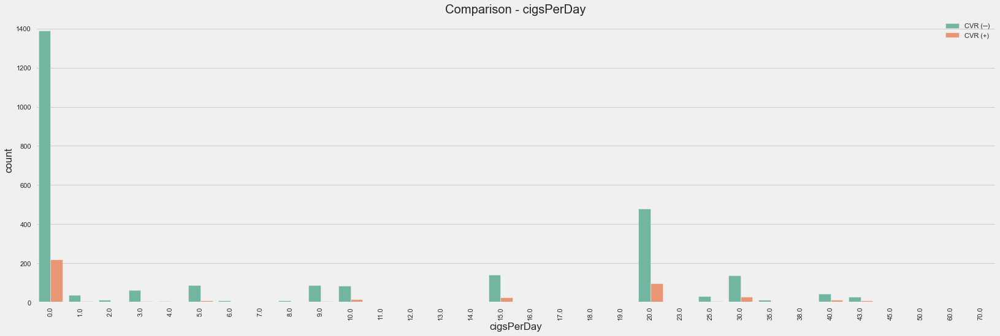

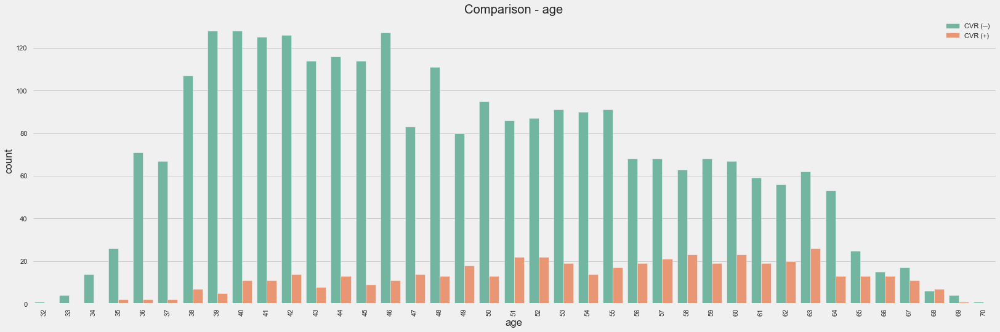

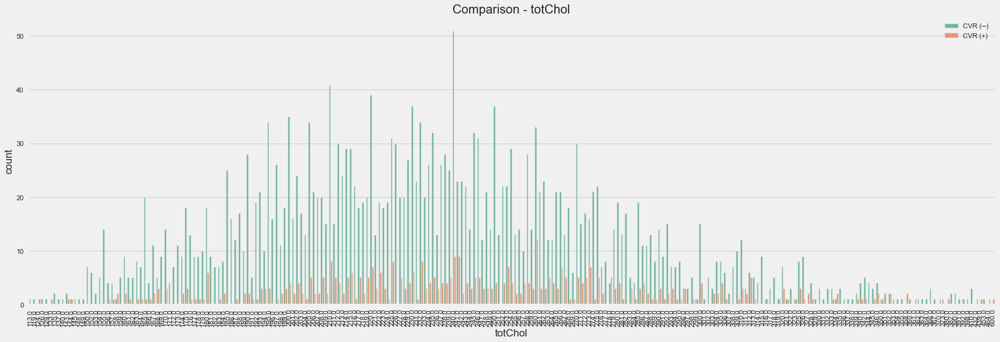

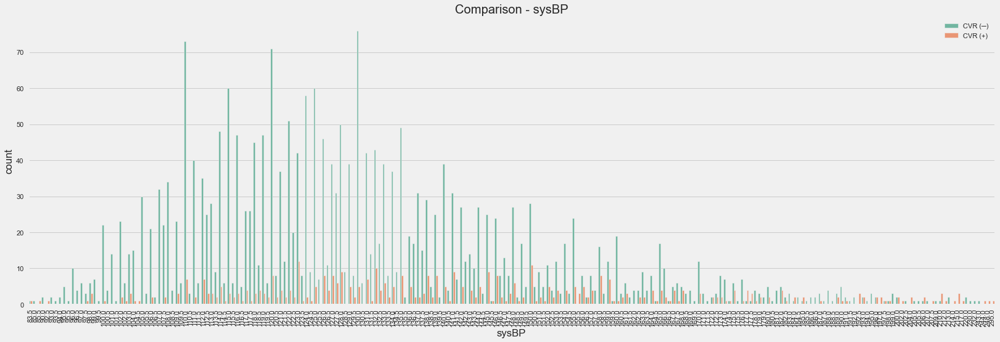

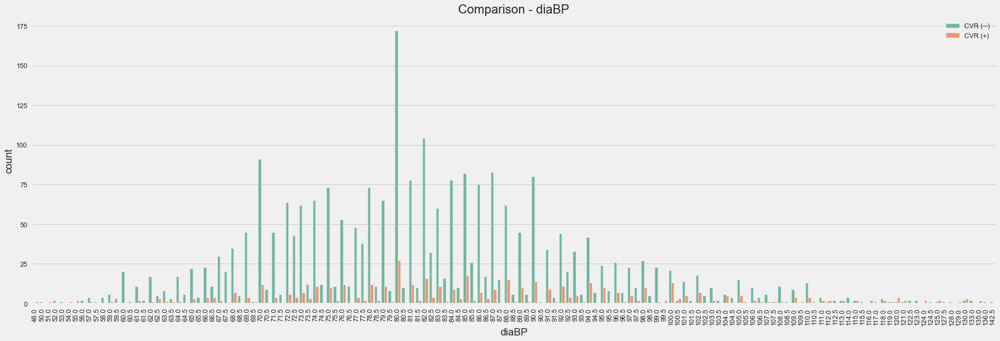

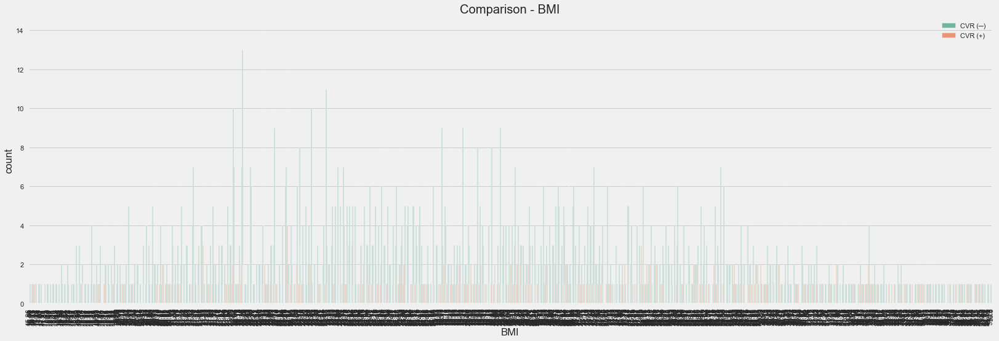

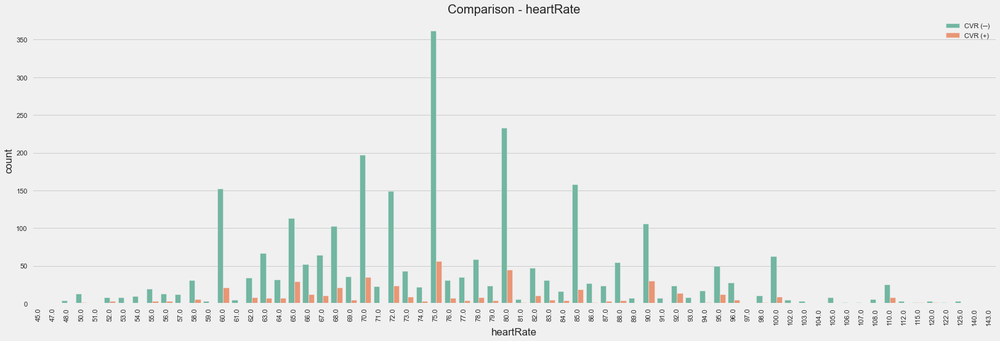

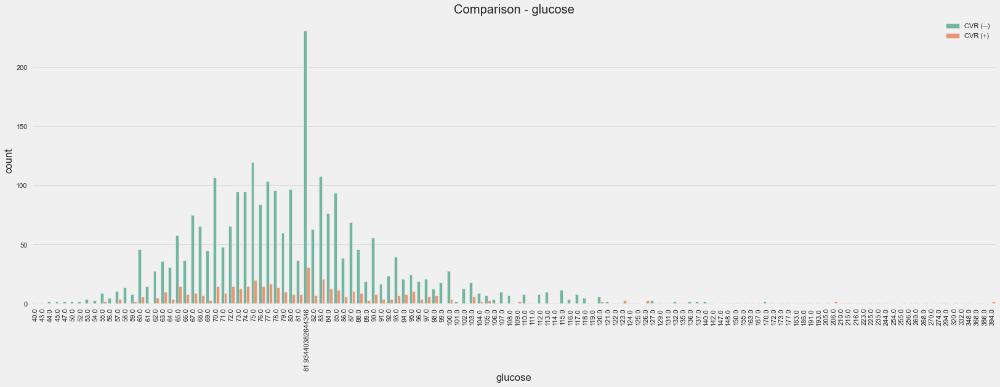

In [ ]:
from matplotlib import rcParams

def NumPlot(train_df1, col):
    # rcParams['figure.figsize'] = 25,8
    plt.figure(figsize=(25,8))
    plt.xticks(rotation=90)
    sns.countplot(x=col, hue='TenYearCHD', data = train_df1, palette="Set2")
    plt.title('Comparison - {}'.format(col))
    plt.legend(['CVR (─)', 'CVR (+)'])

for i in numerical_columns:
  NumPlot(train_df1,i)

#CVR - Cardio vascular Risk 
#(-) denotes lower risk 
#(+) denotes higher risk 

**Here, we tried plotting all numerical varables with the dependent variables. From here we can conclude that,**

(1) The major people who are having Cardio Vasclar Risk(CVR) are at the age of 50-70.

(2) The cholestrol level of people is same for both kind of people who are at risk of CVR and not at risk of CVR. Instead fewer people who are not at risk of CVR are having high Cholestrol level.

(3) If we consider sysBP and diaBP together into consideration, then most of the people are having normal BP. So its hard to conclude to here about the CVR.

(4) Even though many people are having normal range of BMI, but the people whoevever are having high BMI, they are at risk of CVR.

(5) Many people are having normal heartrate range, so its not appropriate to come into conclusion about the CVR at this stage.

(6) In glucose level, we can see some outliers in both kind of people(whoa are at risk and not at risk). But the people who got high glucose level are coming into the category of CVR. So we can conclude that its even one of the factor which may contribute to CVR.

# Analysing the categorical features

**A)-UNIVARIATE ANALYSIS**

**Which gender is prone to coronary heart disease?**

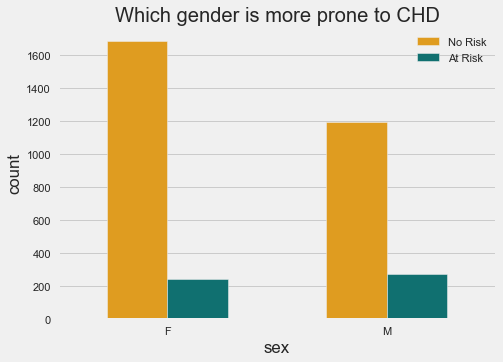

In [ ]:
my_palette = {0 : 'orange' , 1 : 'teal'}
#10-year risk of coronary heart disease CHD(binary: “1”, means “Yes”, “0” means “No”)
plt.figure(figsize = (7,5))
sns.countplot(x = df['sex'], hue = df['TenYearCHD'], palette = my_palette, width = 0.55)
plt.title("Which gender is more prone to CHD")
plt.legend(['No Risk','At Risk'])
plt.show()

here female ratio greater in No risk comparitavely to men 

# Diabiatic patient risk to CHD

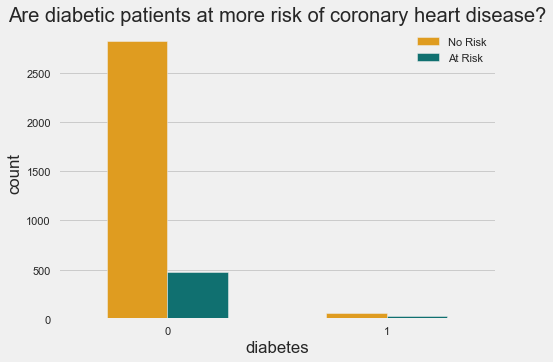

In [ ]:
my_palette = {0 : 'orange' , 1 : 'teal'}
plt.figure(figsize = (7,5))
sns.countplot(x = df['diabetes'], hue = df['TenYearCHD'], palette = my_palette, width = 0.55)
plt.title("Are diabetic patients at more risk of coronary heart disease?")
plt.legend(['No Risk','At Risk'])

plt.show()

There is no clear data on diaetic patient with respect ot CHD

# Are smokers at more risk of coronary heart disease ??

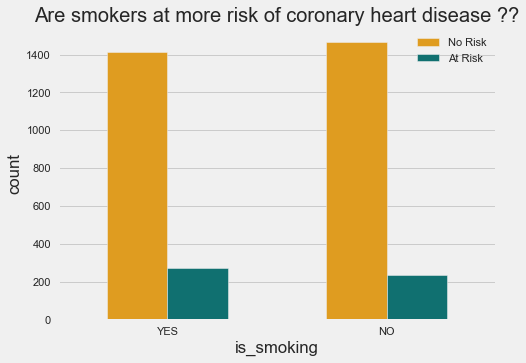

In [ ]:
my_palette = {0 : 'orange' , 1 : 'teal'}
plt.figure(figsize = (7,5))
sns.countplot(x = df['is_smoking'], hue = df['TenYearCHD'], palette = my_palette, width = 0.55)
plt.title("Are smokers at more risk of coronary heart disease ??")
plt.legend(['No Risk','At Risk'])
plt.show()

There is not enough difference to distinguish on the basis of smoking, the person who are non smoker is at no risk with little margin than person who is smoker

# Are hypertensive patients at more risk of coronary heart disease ??

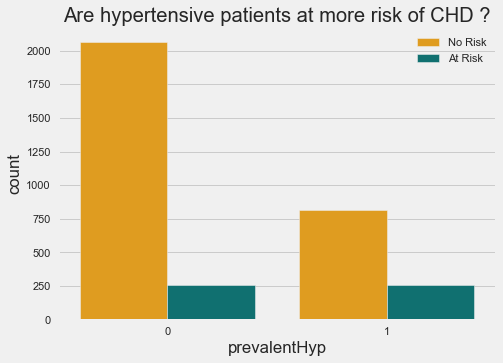

In [ ]:
plt.figure(figsize = (7,5))
my_palette = {0 : 'orange' , 1 : 'teal'}
sns.countplot(x = df['prevalentHyp'], hue = df['TenYearCHD'], palette = my_palette)
plt.title("Are hypertensive patients at more risk of CHD ?")
plt.legend(['No Risk','At Risk'])
plt.show()

No clear sign of CHD in hyper intensive patient.

# Is Heart rate is responsible for CHD ??

In [ ]:
def heartRate_data(row):
    if row['heartRate'] <= 59:
        value = 'Low'
    elif row['heartRate'] < 100:
        value = 'Normal'
    else:
        value = "High"
    
    return value

train_df1['heartRateLabel'] = train_df1.apply(heartRate_data, axis = 1)

train_df1['heartRateLabel'].value_counts



<bound method IndexOpsMixin.value_counts of 1       Normal
2       Normal
3       Normal
4       Normal
5       Normal
         ...  
3384      High
3385    Normal
3386    Normal
3387    Normal
3389    Normal
Name: heartRateLabel, Length: 3189, dtype: object>

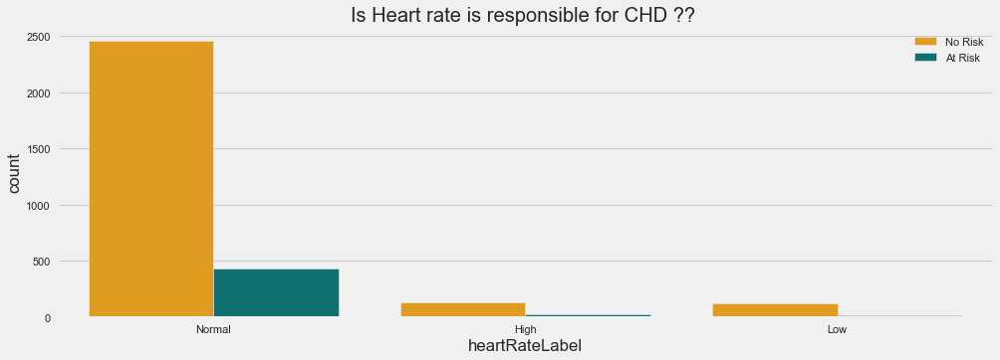

In [ ]:
plt.figure(figsize = (15,5))
my_palette = {0 : 'orange' , 1 : 'teal'}
sns.countplot(x = train_df1['heartRateLabel'], hue = train_df1['TenYearCHD'], palette = my_palette)
plt.title("Is Heart rate is responsible for CHD ?? ")
plt.legend(['No Risk','At Risk'])
plt.show()

Above graph clearly shows that The normal heart rate is at high No risk zone while remainig two we cant clearly tell. 

In [ ]:
train_df1.drop(columns=['heartRateLabel'], inplace=True )

# Are patients with blood pressure on medication at more risk of coronary heart disease ??

[Text(0, 0, '3095'), Text(0, 0, '94')]

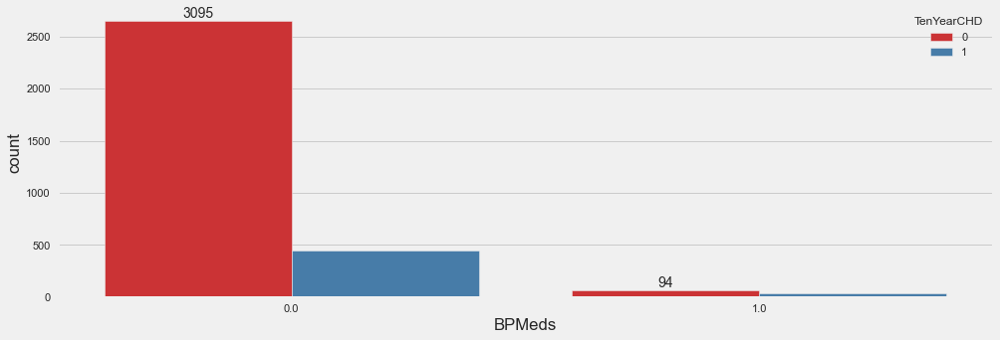

In [ ]:
plt.figure(figsize=(15,5))
ax = sns.countplot(x= train_df1['BPMeds'],
                   order=train_df1['BPMeds'].value_counts(ascending=False).index, hue = train_df1['TenYearCHD']);

abs_values = train_df1['BPMeds'].value_counts(ascending=False).values

ax.bar_label(container=ax.containers[0], labels=abs_values)

The patient who are on BP meds still have high risk of CVR 

# how much smoking affect CHD?

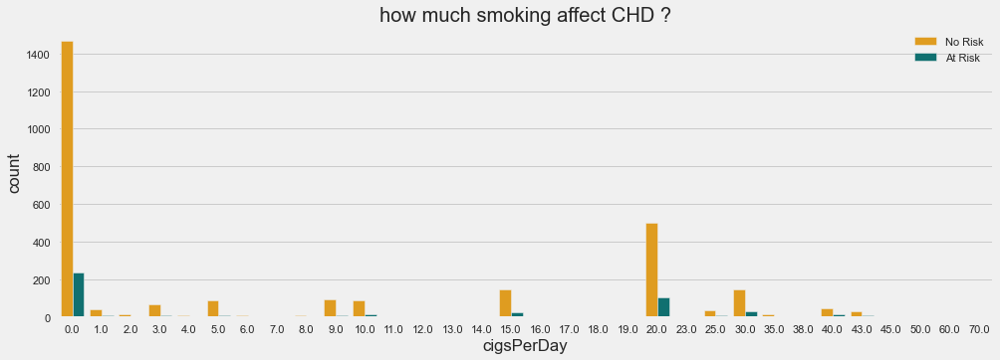

In [ ]:
plt.figure(figsize = (15,5))
my_palette = {0 : 'orange' , 1 : 'teal'}
sns.countplot(x = df['cigsPerDay'], hue = df['TenYearCHD'], palette = my_palette)
plt.title("how much smoking affect CHD ?")
plt.legend(['No Risk','At Risk'])
plt.show()

Here, we are plotting the graph for the dependent variable along with the categorical variables present in the dataset.
We can conclude from here that,

(1) The people whoever already under the HyperTension, are at more risk of CVR

(2) Whether people smoke or not smoke, they are at risk of CVR.

(3) Its shocking to see that the people who never got any medication barely comes under the risk of CVR. The people who are under BP medications are at high risk of CVR.

(4) When we compare males and females, males are at more risk of CVR.

(5) We can clearly see that, the people who had only basic education i.e., education 1 are at more risk of CVR. And its gradually decreasing with increase in education. It might be because that the people wo are educated are taking much precaustions to avoid CVR.

(6) The non dibiatic patient are at much lower risk rather than dibiatic patient. 

# BMI with CHD risk 

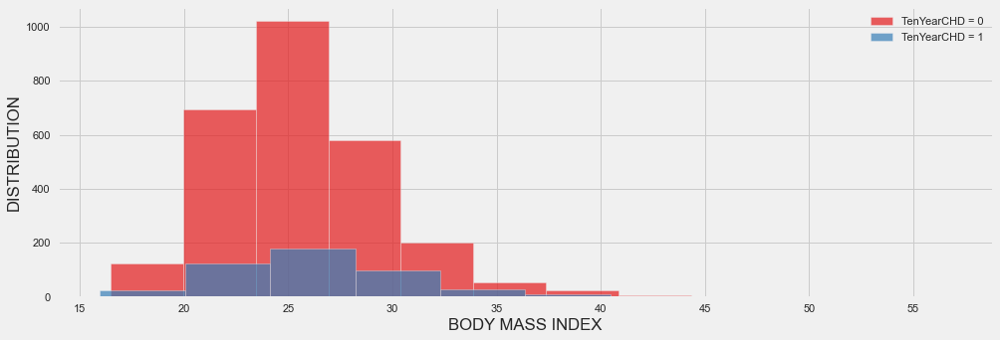

In [ ]:
plt.figure(figsize=(15,5))

plt.hist(train_df1['BMI'][df['TenYearCHD'] == 0], alpha = 0.7, label = 'TenYearCHD = 0')
plt.hist(train_df1['BMI'][df['TenYearCHD'] == 1], alpha = 0.7, label = 'TenYearCHD = 1')
plt.ylabel('DISTRIBUTION')
plt.xlabel('BODY MASS INDEX')
plt.legend()

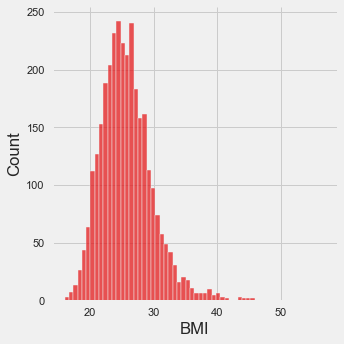

In [ ]:
sns.displot(train_df1['BMI'])

<AxesSubplot: xlabel='TenYearCHD', ylabel='BMI'>

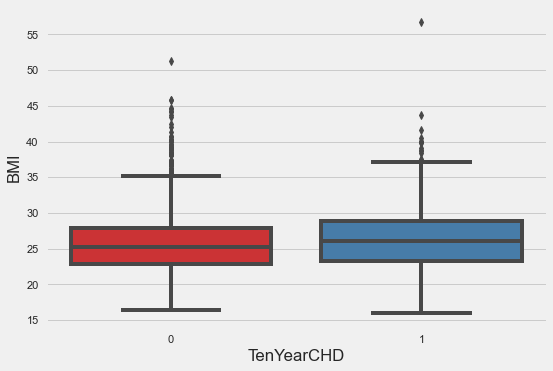

In [ ]:
sns.boxplot(data=train_df1,x='TenYearCHD',y='BMI')

Most of patient have BMI range between 20-30 which is good but there is not clear sign in significance of BMI and CHD 


**Age and CVR with other numerical columns**

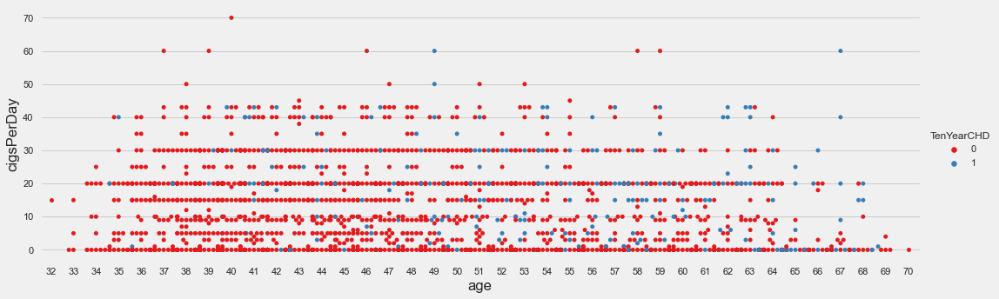

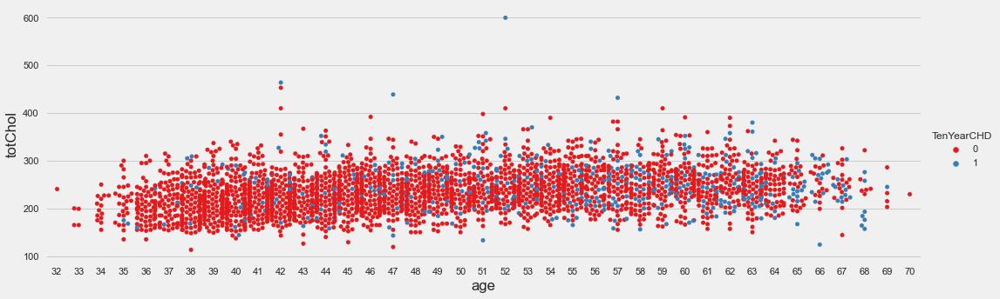

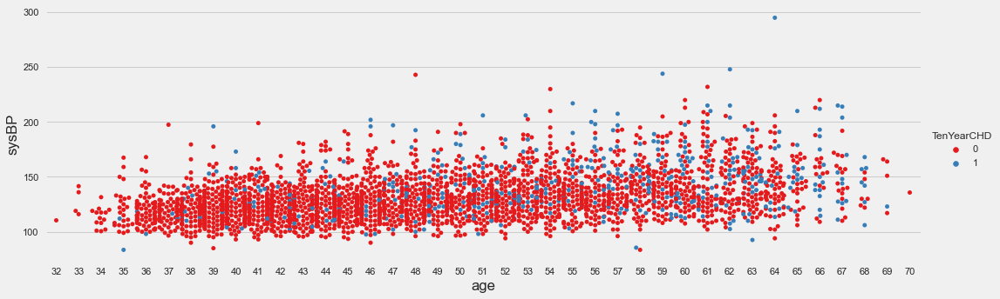

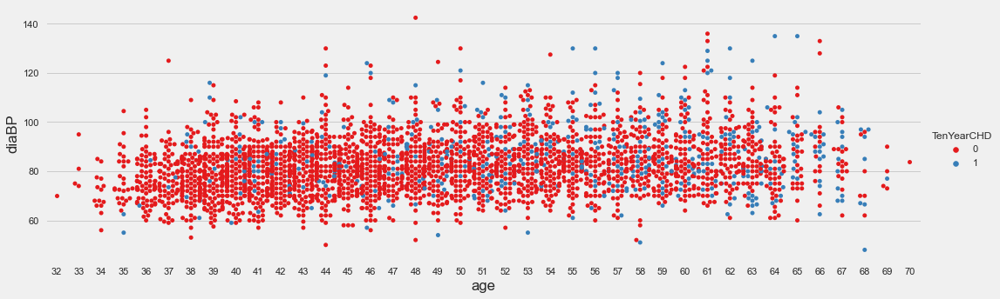

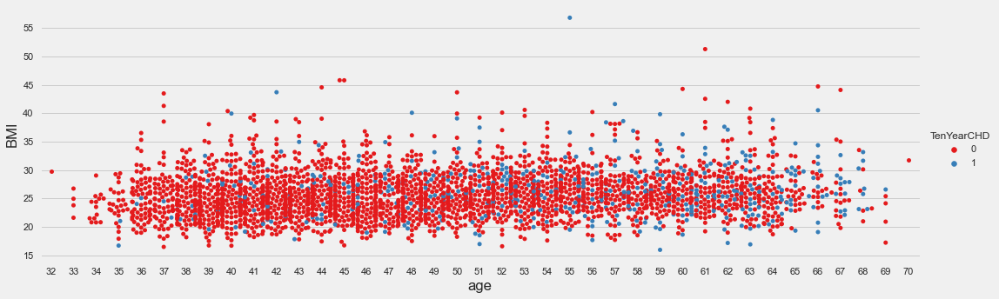

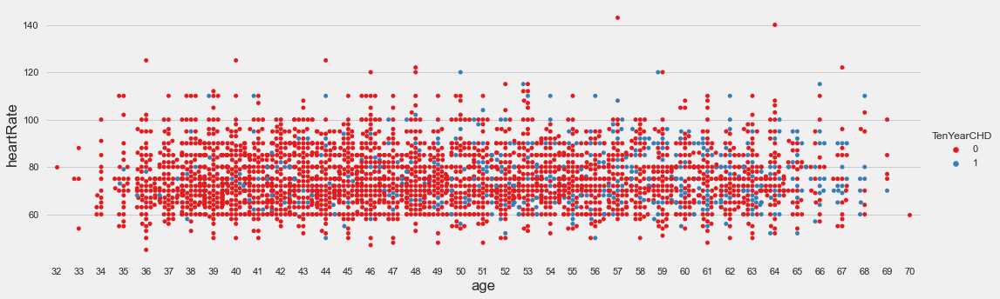

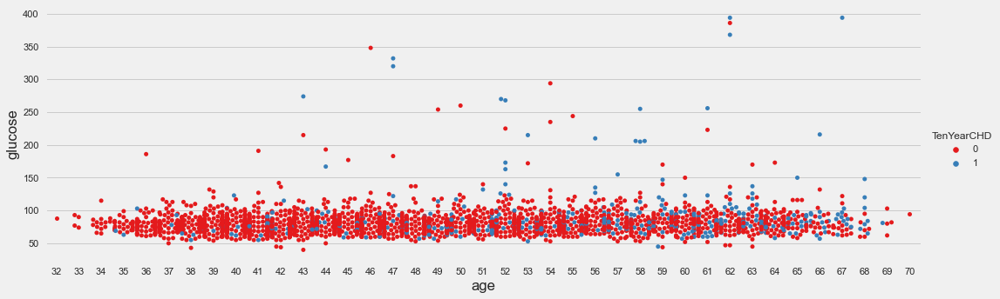

In [ ]:
for i in numerical_columns:
  if i!='age':
    sns.catplot(x="age", y=i, hue="TenYearCHD", kind="swarm", data=train_df1,height=5,  aspect=3)

Here we can observe that,
(1) The people who were under the risk of CVR were from the age>34. And age did not matter to any of other numerical variables. We can see same level of measures such as BP, BMI etc., for all age group.

(2) The cholestrol level for these peple is slighly more when we compare it with the people who are not at risk of CVR. And at the age of 70, even though they were having slighly low level of cholestrol, they were at risk of CVR.

(3) If we consider sysBP, diaBP, heart rate and BMI together for the overall conclusion, we can conclude that all the people who are at risk are having high values of these measures than the people who are not at risk of CVR.

**Diabetes and CVR with other numerical columns**

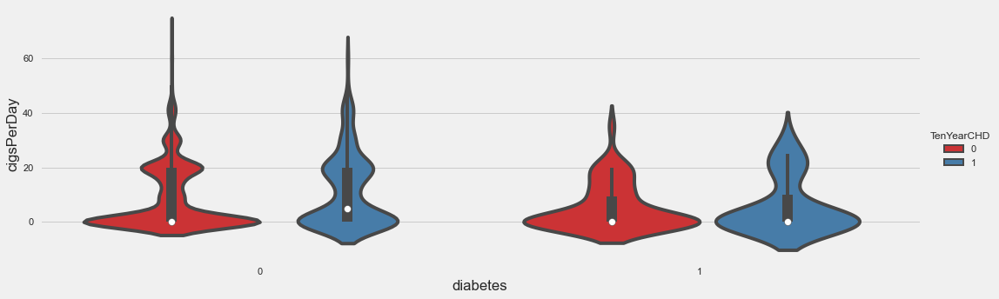

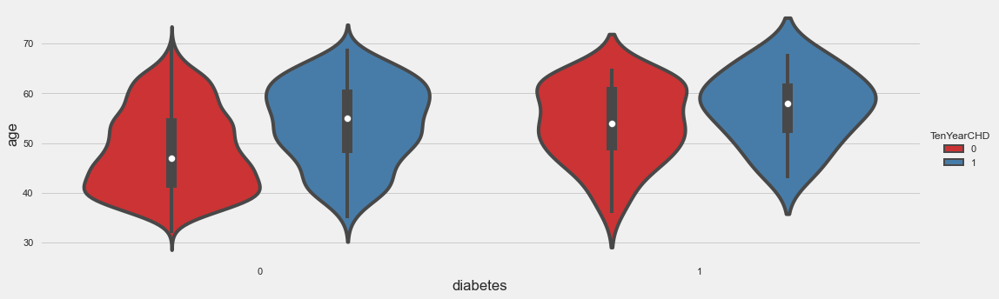

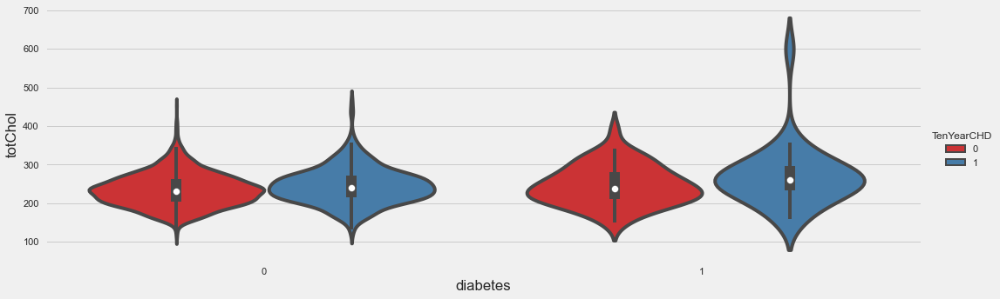

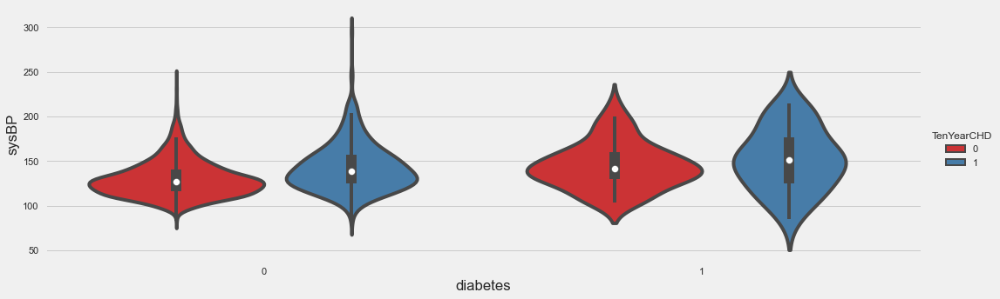

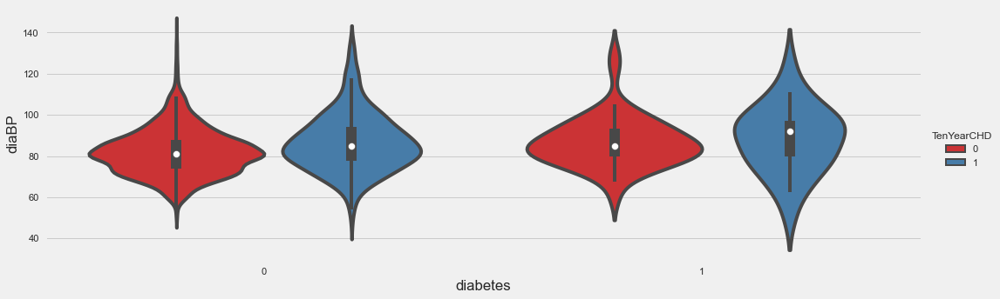

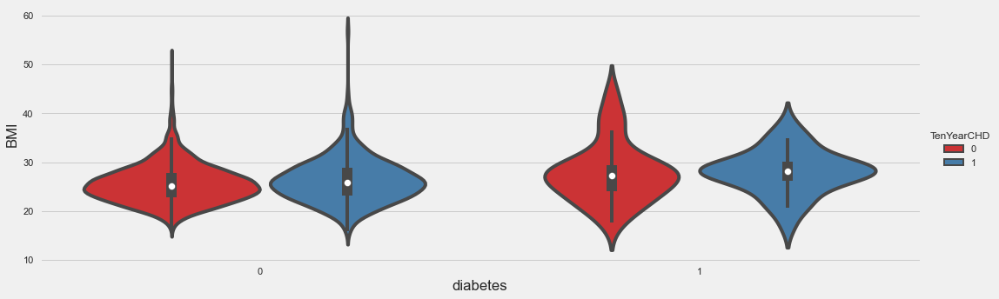

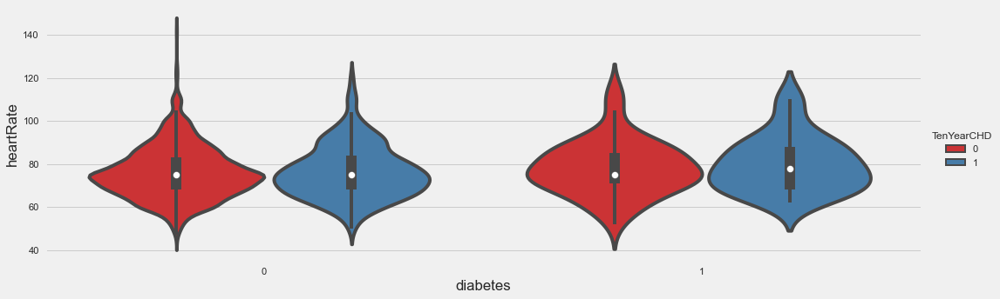

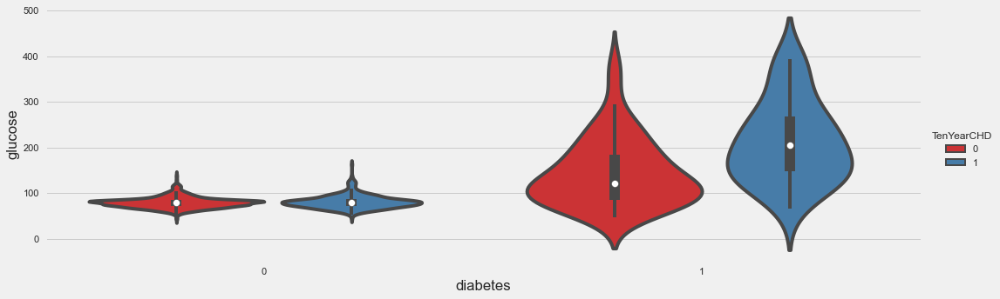

In [ ]:
for i in numerical_columns:
  sns.catplot(x="diabetes", y=i, hue="TenYearCHD", kind="violin", data=train_df1,height=5, aspect=3)


Here, we can observe that,
(1) Even though they had diabetes or not, they are at same level of risk of CVR. But its high between the age group 50-70.

(2) We say that cholestrol and diabetes are related, but from the data, its contrary to our assumption. Even though many people have very high level of high cholestrol, they were not at risk of diabetes nor CVR. But if people had diabetes and cholestrol levels are high then they are at high risk of CVR.

(3) BP and heartrate has nothing to do th the diabetes in here. Many people who are at risk of CVR and diabetes are actually maintaining a normal range of BP and heart rate.

(4) If people are already having diabetes and if they have high BMI then they are at high risk of CVR.

# Standardization - Min Max Scaler


**Distribution plot of all numerical variables**

<AxesSubplot: ylabel='Density'>

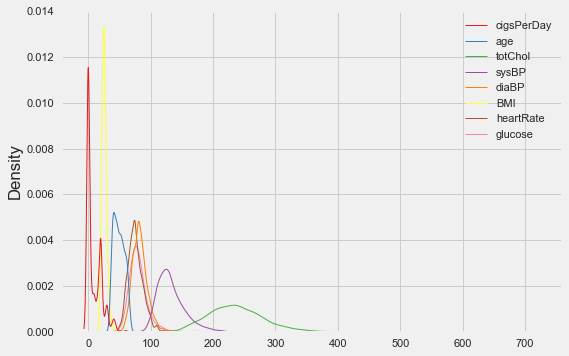

In [ ]:
#Before standardization
data = train_df[numerical_columns]
sns.kdeplot(data, linewidth = 1)

Text(0.5, 0, 'Numerical variables')

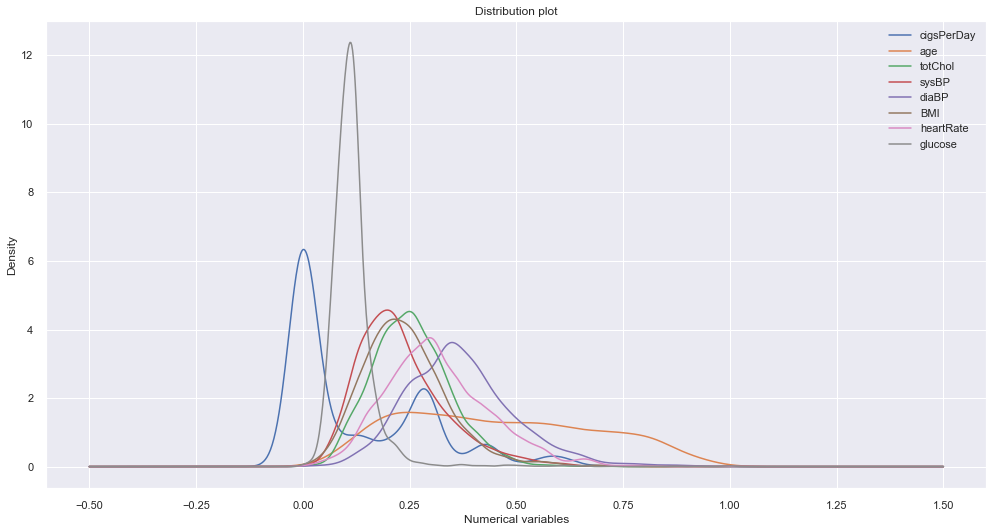

In [ ]:
#Min max scaler
column_names = numerical_columns
# column_names
#taking columns to do the minmaxscaling
cardio_2 = pd.DataFrame()
#using standardization as both numeric columns are in different scale
scaler = MinMaxScaler()
scaled = scaler.fit_transform(train_df1[numerical_columns])
#print(scaled)
cardio_2 = pd.DataFrame(scaler.fit_transform(train_df1[numerical_columns]))
cardio_2.columns = column_names

sns.set(rc = {'figure.figsize':(15,8)})
cardio_2.plot.kde()
plt.title("Distribution plot")
plt.xlabel("Numerical variables")

We can observe that there are many people with high level of glucose followed by cig_per_day and total cholestrol. It might be that the lifestyle of people are contributing more to these values. So we observe some peaks in these vlaues.

# Transformation

Data transformation includes data cleaning techniques and a data reduction technique to convert the data into the appropriate form. Data transformation is an essential data preprocessing technique that must be performed on the data before data mining to provide patterns that are easier to understand.

In [ ]:
# Applying transformation and looking the graph before and after transformation

import scipy.stats as stats
import pylab

def to_plot(DF,column):
  plt.figure(figsize=(10,6))
  plt.subplot(1,2,1)
  sns.distplot(DF[column])
  plt.subplot(1,2,2)
  stats.probplot(DF[column],dist='norm',plot=pylab)
  plt.show()

def log_transform(DF,column):
  print("Before Transformation")
  to_plot(DF,column)
  # applying log transformation
  DF[column]=np.log1p(DF[column])
  #plotting
  print("After Transformation")
  to_plot(DF,column)
  # stats.probplot()

def box_cox_transform(DF,column):
  print("Before Transformation")
  to_plot(DF,column)
  # applying boxcox transformation
  DF[column],parameters=stats.boxcox(DF[column])
  print("After Transformation")
  to_plot(DF,column)
numerical_columns = ['age', 'totChol', 'BMI', 'heartRate', 'glucose']
#updating as we deleted sysBP and diaBP

In [ ]:
numerical_columns = ['age','cigsPerDay' 'totChol', 'BMI', 'heartRate', 'glucose']
#updating as we deleted sysBP and diaBP

Before Transformation
After Transformation
Before Transformation
After Transformation
Before Transformation
After Transformation
Before Transformation
After Transformation
Before Transformation
After Transformation
Before Transformation
After Transformation


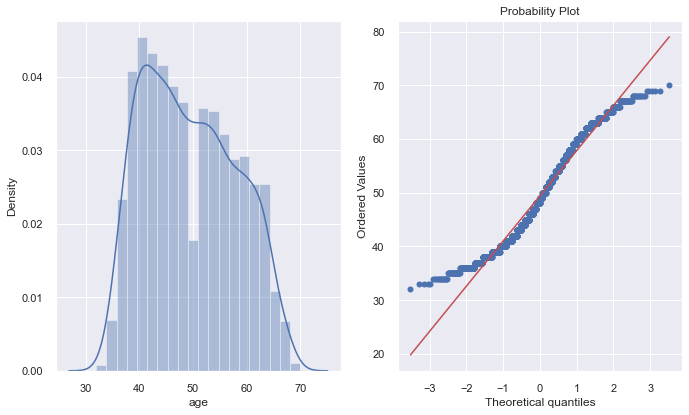

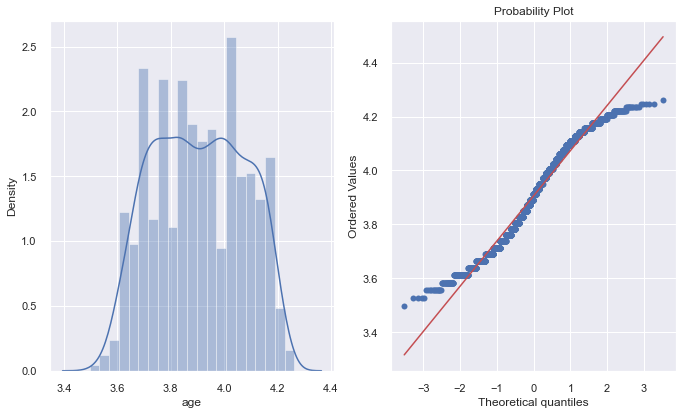

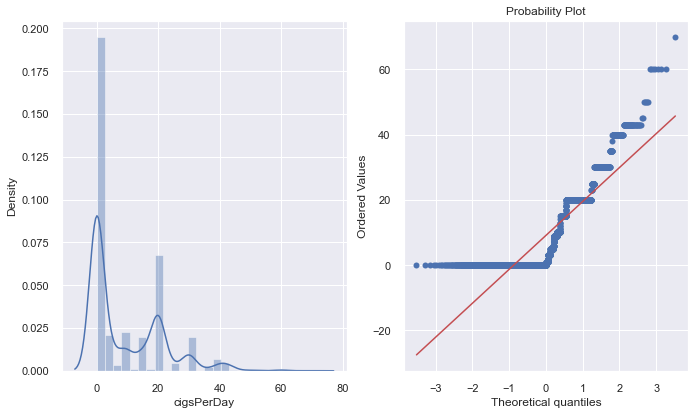

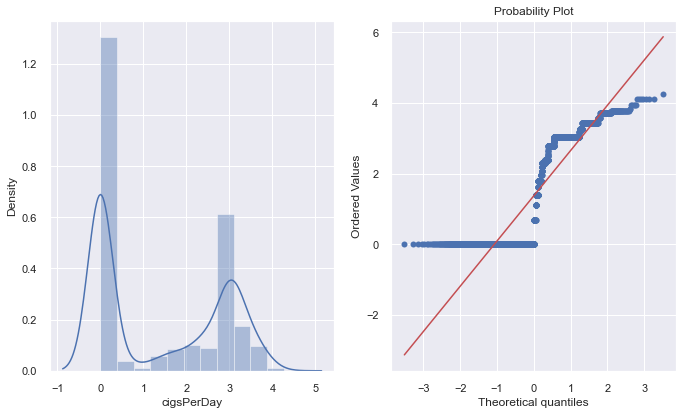

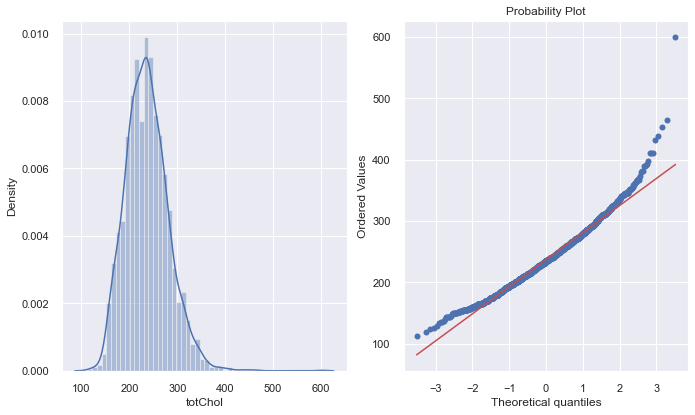

...

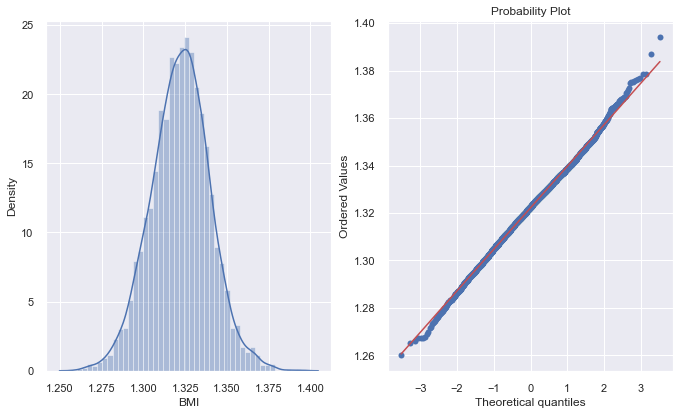

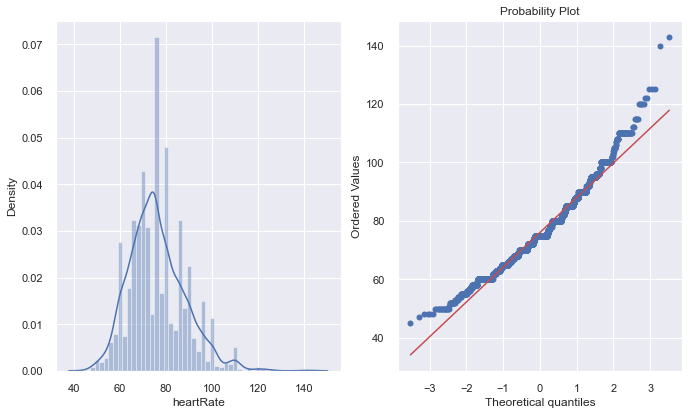

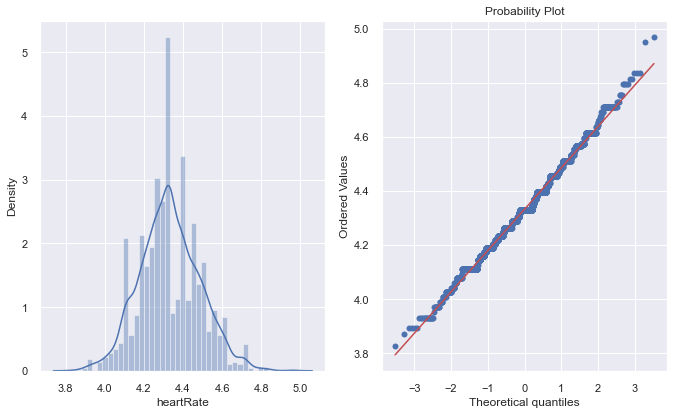

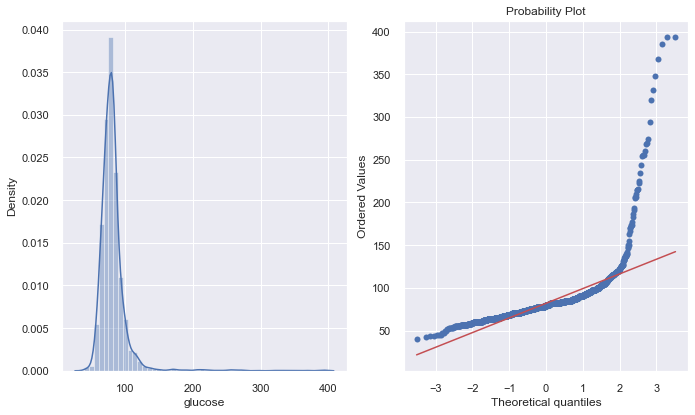

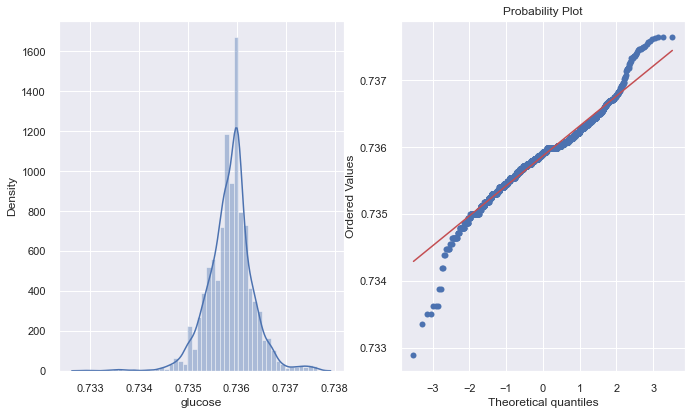

In [ ]:
#Applying the transformaation to only numerical columns
log_transform(train_df1,'age')
log_transform(train_df1,'cigsPerDay')
log_transform(train_df1,'totChol')
box_cox_transform(train_df1,'BMI')
log_transform(train_df1,'heartRate')
box_cox_transform(train_df1,'glucose')

# Feature Engineering 

## Systolic and Diastolic blood pressure has a high correlation that can be commonly classified into hypertension.

In [ ]:
def blood_presure_classification(SysBP, DiaBP):
  if (SysBP < 90) or (DiaBP < 60):
    return 0 # 'Hypotension'
  if (SysBP < 120) and (DiaBP < 80):
    return 1 # 'Optimal'
  if (SysBP < 130) or (DiaBP < 86):
    return 2 # 'Normal'
  if (SysBP < 140) or (DiaBP < 90):
    return 3 # 'PreHypertensive'
  if (SysBP > 140) and (DiaBP < 90):
    return 4 # 'IsolatedSystolicHypertension'
  if (SysBP < 160) or (DiaBP < 100):
    return 5 # 'GradeI'
  if (SysBP < 180) or (DiaBP < 110):
    return 6 # 'GradeII'
  return 7 # 'GradeIII'

train_df1['Hypertension'] = train_df1.apply(lambda x: blood_presure_classification(x['sysBP'],x['diaBP']),axis=1)
train_df.head()

,id,age,education,sex,is_smoking,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,TenYearCHD
0,0,64,2.0,F,YES,3.0,0.0,0,0,0,221.0,148.0,85.0,NaN,90.0,80.0,1
1,1,36,4.0,M,NO,0.0,0.0,0,1,0,212.0,168.0,98.0,29.77,72.0,75.0,0
2,2,46,1.0,F,YES,10.0,0.0,0,0,0,250.0,116.0,71.0,20.35,88.0,94.0,0
3,3,50,1.0,M,YES,20.0,0.0,0,1,0,233.0,158.0,88.0,28.26,68.0,94.0,1
4,4,64,1.0,F,YES,30.0,0.0,0,0,0,241.0,136.5,85.0,26.42,70.0,77.0,0


## Blood glucose levels can be used to classify the severity of Diabetes.

In [ ]:
def diabetes_grade(glucose):
  if glucose < 100:
    return 1 # 'Normal'
  if glucose < 125:
    return 2 # 'Prediabetic'
  if glucose < 200:
    return 3 # 'Mild'
  if glucose < 400:
    return 4 # 'Moderate'
  return 5 # 'Severe'

train_df1['Diabetes'] = train_df1['glucose'].apply(lambda x: diabetes_grade(x))
train_df.head()

,id,age,education,sex,is_smoking,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,TenYearCHD
0,0,64,2.0,F,YES,3.0,0.0,0,0,0,221.0,148.0,85.0,NaN,90.0,80.0,1
1,1,36,4.0,M,NO,0.0,0.0,0,1,0,212.0,168.0,98.0,29.77,72.0,75.0,0
2,2,46,1.0,F,YES,10.0,0.0,0,0,0,250.0,116.0,71.0,20.35,88.0,94.0,0
3,3,50,1.0,M,YES,20.0,0.0,0,1,0,233.0,158.0,88.0,28.26,68.0,94.0,1
4,4,64,1.0,F,YES,30.0,0.0,0,0,0,241.0,136.5,85.0,26.42,70.0,77.0,0


<Figure size 1080x504 with 0 Axes>

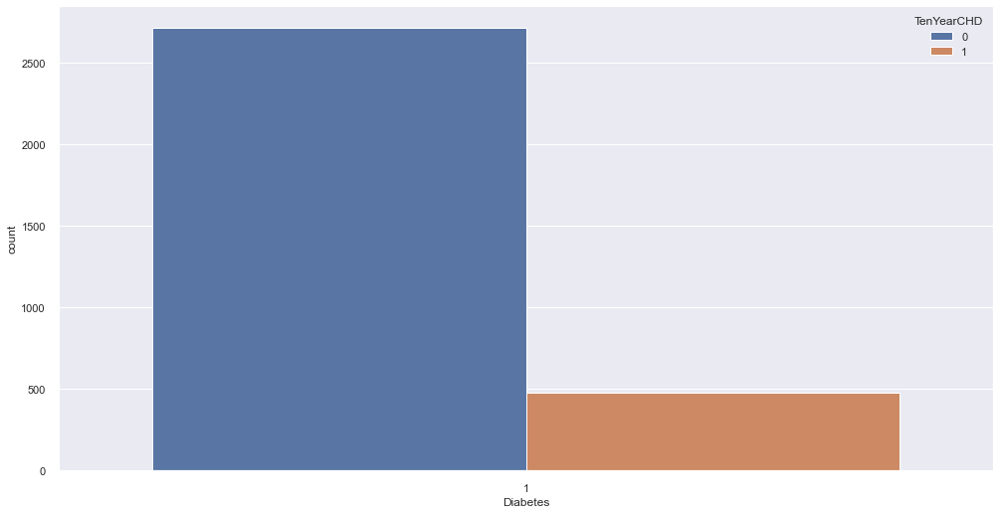

<Figure size 1080x504 with 0 Axes>

In [ ]:
sns.countplot(hue = 'TenYearCHD', x= 'Diabetes', data = train_df1)
plt.figure(figsize=(15,7))

In [ ]:
#We must check to VIF number between Diabetes and TenYearCHD
from statsmodels.stats.outliers_influence import variance_inflation_factor as vf
feat = train_df1['TenYearCHD']
feat1 = train_df1['Diabetes']
features = pd.concat([feat, feat1], axis = 1)
vif = vf(features.values, 0)
print(vif)

1.0000000000000016


we got good VIF score so we will be keeping Diabetes as feature

The absolute number of cigarettes per day is not much useful variable because the stiffness of blood vessels increases as the number of cigarettes consumed per day increases. So new feature containing log-transformed value could be more useful.

In [ ]:
# New factor taking smoking factor into account 
train_df1['SmokingFactor'] = train_df1['cigsPerDay'].apply(lambda x: 0 if x < 1 else np.log(x))
df.head()

,id,age,education,sex,is_smoking,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,TenYearCHD
0,0,64,2.0,F,YES,3.0,0.0,0,0,0,221.0,148.0,85.0,NaN,90.0,80.0,1
1,1,36,4.0,M,NO,0.0,0.0,0,1,0,212.0,168.0,98.0,29.77,72.0,75.0,0
2,2,46,1.0,F,YES,10.0,0.0,0,0,0,250.0,116.0,71.0,20.35,88.0,94.0,0
3,3,50,1.0,M,YES,20.0,0.0,0,1,0,233.0,158.0,88.0,28.26,68.0,94.0,1
4,4,64,1.0,F,YES,30.0,0.0,0,0,0,241.0,136.5,85.0,26.42,70.0,77.0,0


In [ ]:
# remove not useful columns
train_df1.drop(columns=['id', 'prevalentHyp', 'sysBP', 'diaBP', 'diabetes', 'is_smoking', 'cigsPerDay','Diabetes'], inplace=True)

# Checing Multicollinearity

Multicollinearity should be checked till we build models to make sure that we are not adding any variables with high correlation.

<AxesSubplot: >

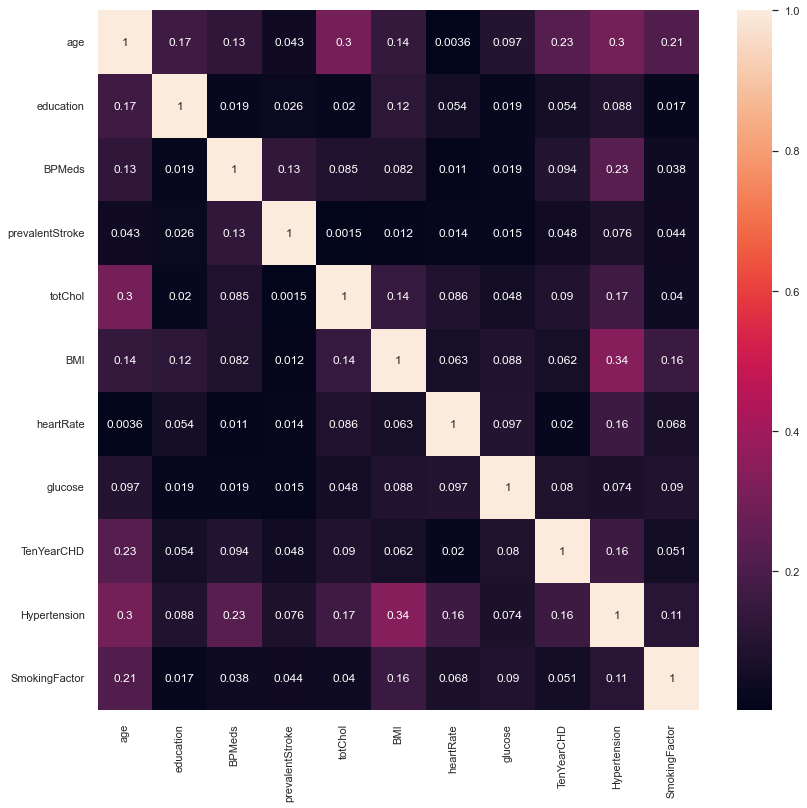

In [ ]:
# Plotting the correlation matrix using heatmap
plt.figure(figsize=(12,12))
correlation = train_df1.corr()
sns.heatmap(abs(correlation), annot=True)

## In above multicolinearity we can see there is no significant correlation with dependant variable 

## Distribution of all numerical variables by plotting histogram

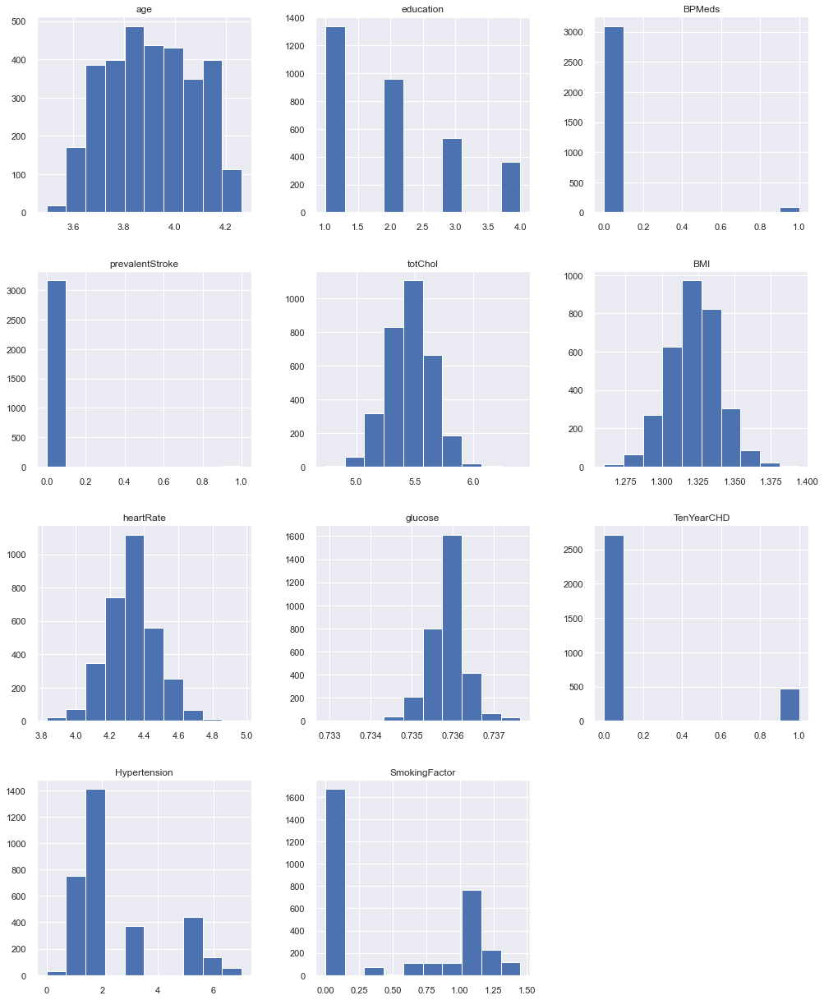

In [ ]:
# plot histogram to see the distribution of the data
fig = plt.figure(figsize = (15,20))
ax = fig.gca()
train_df1.hist(ax = ax)
plt.show()

In [ ]:
# remove not useful columns
train_df1.drop(columns=['BPMeds', 'prevalentStroke'], inplace=True)

## converting categorical data into numerical data 

In [ ]:
train_df1['sex'] = train_df1['sex'].apply(lambda x: 1 if x == 'M' else 0)

In [ ]:
train_df1

,age,education,sex,totChol,BMI,heartRate,glucose,TenYearCHD,Hypertension,SmokingFactor
1,3.610918,4.0,1,5.361292,1.340100,4.290459,0.735750,0,5,0.000000
2,3.850148,1.0,0,5.525453,1.295382,4.488636,0.736310,0,1,0.874591
3,3.931826,1.0,1,5.455321,1.334632,4.234107,0.736310,1,3,1.113344
4,4.174387,1.0,0,5.488938,1.327272,4.262680,0.735825,0,2,1.233722
5,4.127134,3.0,0,5.609472,1.349787,4.454347,0.735296,1,7,0.000000
...,...,...,...,...,...,...,...,...,...,...
3384,4.127134,1.0,0,5.384495,1.329601,4.663439,0.736655,0,3,0.000000
3385,4.110874,1.0,0,5.568345,1.338377,4.262680,0.736492,0,2,0.000000
3386,3.850148,1.0,0,5.298317,1.305266,4.394449,0.736053,0,0,0.000000
3387,3.806662,3.0,1,5.866468,1.337081,4.304065,0.735630,1,6,0.326634


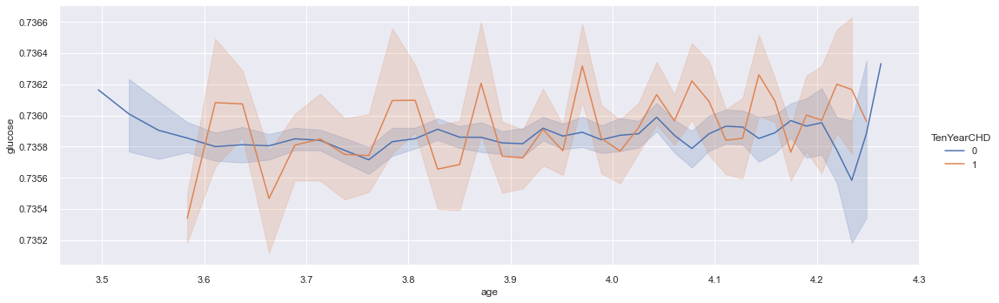

In [ ]:
#checking for glucose and age relationship with TenYearCHD
sns.relplot(x="age", y='glucose', hue="TenYearCHD", kind='line', data=train_df1,height=5, aspect=3,dashes=False, markers=True)

# Train Test Split

Defining Dependent variable and Independent variable

In [ ]:
dependent_variable = 'TenYearCHD'
independent_variable = list(train_df1.columns)
independent_variable.remove(dependent_variable)
print(independent_variable)

['age', 'education', 'sex', 'totChol', 'BMI', 'heartRate', 'glucose', 'Hypertension', 'SmokingFactor']


In [ ]:
X = train_df1[independent_variable].values
y = train_df1[dependent_variable].values

**Treat Class imbalance by SMOTE or MSMOTE**

Let's Resample the dataset to over come this imbalance. We will apply SMOTE (Synthetic Minority Oversampling Technique) to resample the data. It works by randomly picking a point from the minority class and computing the k-nearest neighbors for this point. The synthetic points are added between the chosen point and its neighbors.

In [ ]:
# Balancing the data using SMOTE

from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline
from collections import Counter

# the numbers before SMOTE
num_before = dict(Counter(y))

#perform SMOTE

# define pipeline
under = RandomUnderSampler(sampling_strategy=0.8)
over = SMOTE(sampling_strategy=0.8)
steps = [('o', over), ('u', under)]
pipeline = Pipeline(steps=steps)

# transform the dataset
X_smote, y_smote = pipeline.fit_resample(X, y)


#the numbers after SMOTE
num_after =dict(Counter(y_smote))
print(num_before, num_after)

#using class_wieghts

class_weight = {0: 1, 1: 6}

{0: 2714, 1: 475} {0: 2713, 1: 2171}


In [ ]:
# split the data
X_train,X_test,y_train,y_test = train_test_split(X_smote,y_smote,test_size=.2)

In [ ]:
# scaling the data
scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_train = pd.DataFrame(X_train_scaled)

X_test_scaled = scaler.transform(X_test)
X_test = pd.DataFrame(X_test_scaled)

# Building AI model

## 1) K Nearest neighbour

In [ ]:
# calculate accuracy score for first 10 neighbors
# Setup arrays to store training and test accuracies
neighbors = 10
train_accuracy = np.empty(neighbors)
test_accuracy = np.empty(neighbors)

for i in range(1, neighbors + 1):
    # Setup a knn classifier with k neighbors
    knn = KNeighborsClassifier(n_neighbors=i)
    # Fit the model
    knn.fit(X_train, y_train)
    # Compute accuracy on the training set
    train_accuracy[i - 1] = knn.score(X_train, y_train)
    # Compute accuracy on the test set
    test_accuracy[i - 1] = knn.score(X_test, y_test)
    
    
    # print accuracy
print("Train Accuracy: ", train_accuracy)
print("Test Accuracy: ", test_accuracy)

Train Accuracy:  [1.         0.97312516 0.90069107 0.90120297 0.85641157 0.85743537
 0.82416176 0.82953673 0.80854876 0.80650115]
Test Accuracy:  [0.82088025 0.82804504 0.78812692 0.79733879 0.77584442 0.77891505
 0.76356192 0.76560901 0.74923234 0.75127943]


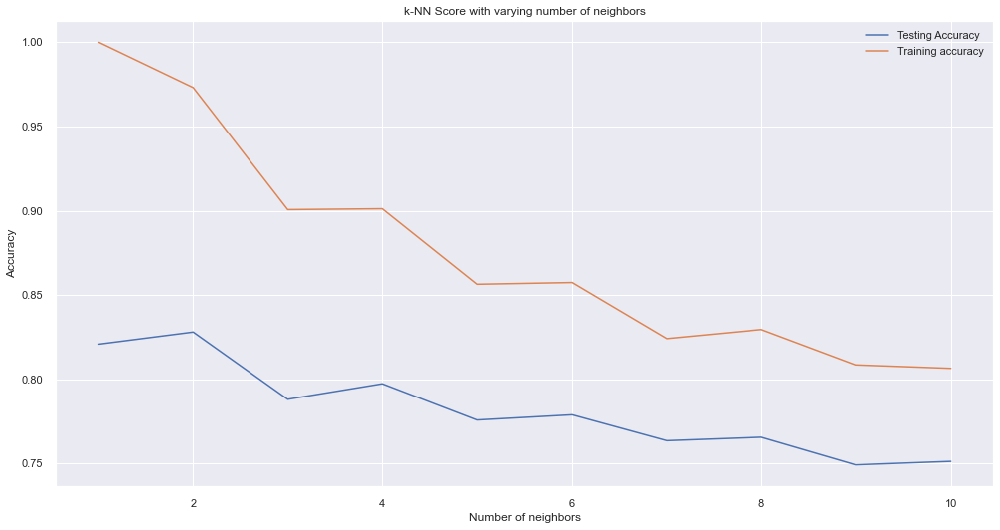

In [ ]:
# Generate plot
plt.title('k-NN Score with varying number of neighbors')
x_axis = [i for i in range(1,11)]
plt.plot(x_axis, test_accuracy, label='Testing Accuracy')
plt.plot(x_axis, train_accuracy, label='Training accuracy')
plt.legend()
plt.xlabel('Number of neighbors')
plt.ylabel('Accuracy')
plt.show()

Webcan see that test score is increasing as number of neighbours increases.

## Hyper parameter tuning - KNN

Let's try to find best parameter for knn.

In [ ]:
param_grid = {'n_neighbors':np.arange(1,100)}

In [ ]:
knn = KNeighborsClassifier()
knn_cv= GridSearchCV(knn,param_grid,cv=5)
knn_cv.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51,
       52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68,
       69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85,
       86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99])})

In [ ]:
knn_cv.best_score_

0.8198044346057747

In [ ]:
knn_cv.best_params_

{'n_neighbors': 1}

In [ ]:
# predictions
knn_predict = knn_cv.predict(X_test)

print(classification_report(y_test,knn_predict))

              precision    recall  f1-score   support

           0       0.92      0.74      0.82       541
           1       0.74      0.92      0.82       436

    accuracy                           0.82       977
   macro avg       0.83      0.83      0.82       977
weighted avg       0.84      0.82      0.82       977



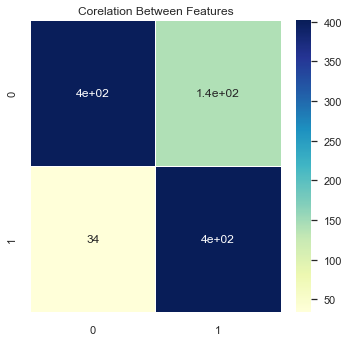

In [ ]:
conf_mat = confusion_matrix(y_test, knn_predict)
plt.rcParams['figure.figsize'] = (5, 5) 
sns.heatmap(conf_mat, annot = True, linewidths=.5, cmap="YlGnBu")
plt.title('Corelation Between Features')
plt.show()

## 2) Logistic Regression 

In [ ]:
# create and train logistic regression model
logistic_regression_model = LogisticRegression(fit_intercept=True, max_iter=10000)
logistic_regression_model.fit(X_train, y_train)

LogisticRegression(max_iter=10000)

In [ ]:
# Get the model coefficients
logistic_regression_model.coef_

array([[ 0.73169463, -0.06098655,  0.1841061 ,  0.12562674,  0.07130332,
        -0.07039486,  0.18485128,  0.29784719,  0.35484405]])

In [ ]:
# Get the predicted probabilities
train_preds = logistic_regression_model.predict(X_train)
test_preds = logistic_regression_model.predict(X_test)

In [ ]:
# Get the accuracy scores
train_accuracy = accuracy_score(train_preds,y_train)
test_accuracy = accuracy_score(test_preds,y_test)

print("The accuracy on train data is ", train_accuracy)
print("The accuracy on test data is ", test_accuracy)

The accuracy on train data is  0.6731507550550294
The accuracy on test data is  0.6724667349027635


[[393 148]
 [172 264]]


[Text(0, 0.5, 'No Risk'), Text(0, 1.5, 'At Risk')]

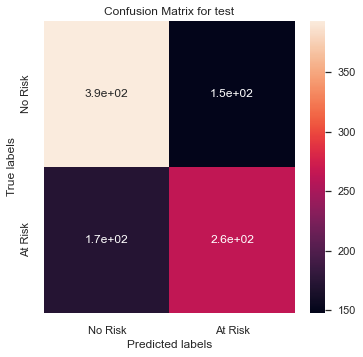

In [ ]:
# Get the confusion matrix for test
labels = ['No Risk', 'At Risk']
cm = confusion_matrix(y_test, test_preds)
print(cm)
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax); #annot=True to annotate cells
# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix for test')
ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)

[Text(0, 0.5, 'No Risk'), Text(0, 1.5, 'At Risk')]

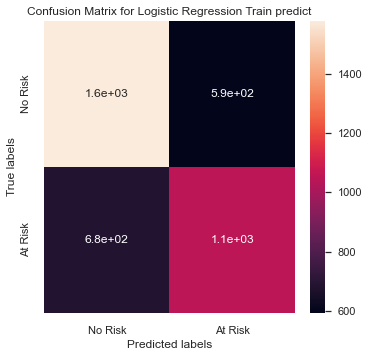

In [ ]:
# Get the confusion matrix for train
labels = ['No Risk', 'At Risk']
cm = confusion_matrix(y_train, train_preds)
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax) #annot=True to annotate cells
# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix for Logistic Regression Train predict')
ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)

In [ ]:
from sklearn.linear_model import LogisticRegressionCV
from sklearn.model_selection import cross_validate

In [ ]:
grid={"C":np.logspace(-5,8,15), "penalty":["l1","l2"]}
logreg = LogisticRegression()

In [ ]:
logreg_cv=GridSearchCV(logreg,grid,cv=10)
logreg_cv.fit(X_train,y_train)


GridSearchCV(cv=10, estimator=LogisticRegression(),
             param_grid={'C': array([1.00000000e-05, 8.48342898e-05, 7.19685673e-04, 6.10540230e-03,
       5.17947468e-02, 4.39397056e-01, 3.72759372e+00, 3.16227766e+01,
       2.68269580e+02, 2.27584593e+03, 1.93069773e+04, 1.63789371e+05,
       1.38949549e+06, 1.17876863e+07, 1.00000000e+08]),
                         'penalty': ['l1', 'l2']})

In [ ]:
# Print the tuned parameters and score
print("Tuned Logistic Regression Parameters: {}".format(logreg_cv.best_params_)) 
print("Best score is {}".format(logreg_cv.best_score_))

Tuned Logistic Regression Parameters: {'C': 0.006105402296585327, 'penalty': 'l2'}
Best score is 0.6705961046626008


In [ ]:
# print acurracy and roc_auc score
print('ROCAUC score:', roc_auc_score(y_test, test_preds))
print('Accuracy score:', accuracy_score(y_test, test_preds))

# Print the classification report for train and test
print(classification_report(y_train, train_preds))
print("\n")
print(classification_report(y_test, test_preds))

ROCAUC score: 0.665968559751734
Accuracy score: 0.6724667349027635
              precision    recall  f1-score   support

           0       0.70      0.73      0.71      2172
           1       0.64      0.61      0.62      1735

    accuracy                           0.67      3907
   macro avg       0.67      0.67      0.67      3907
weighted avg       0.67      0.67      0.67      3907



              precision    recall  f1-score   support

           0       0.70      0.73      0.71       541
           1       0.64      0.61      0.62       436

    accuracy                           0.67       977
   macro avg       0.67      0.67      0.67       977
weighted avg       0.67      0.67      0.67       977



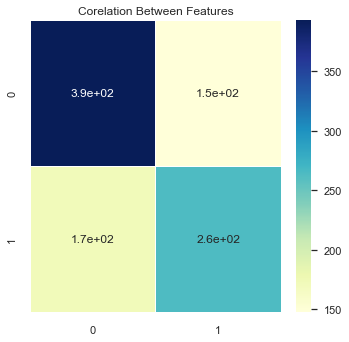

In [ ]:
conf_mat = confusion_matrix(y_test, test_preds)
plt.rcParams['figure.figsize'] = (5, 5) 
sns.heatmap(conf_mat, annot = True, linewidths=.5, cmap="YlGnBu")
plt.title('Corelation Between Features')
plt.show()

# Building Desicion Tree Model

---



Decision tree is a type of supervised learning algorithm that is mostly used in classification problems. It works for both categorical and continuous input and output variables.

In [ ]:
# now we train and build our model
decision_tree_model = DecisionTreeClassifier(criterion="entropy",max_leaf_nodes= 50,random_state=0)
decision_tree_model.fit(X_train,y_train)

DecisionTreeClassifier(criterion='entropy', max_leaf_nodes=50, random_state=0)

In [ ]:
#Predicting on test cell and train cell
train_preds = decision_tree_model.predict(X_train)
test_preds = decision_tree_model.predict(X_test)

#Measuring Accuracy and AUC-ROC score
testing_accuracy = accuracy_score(y_test, test_preds) * 100
print(f'the testing accuracy is {testing_accuracy}')
training_accuracy = accuracy_score(y_train,train_preds) *100
print(f'the training accuracy is {training_accuracy}')

the testing accuracy is 77.37973387922212
the training accuracy is 78.70488866137701


[Text(0.4409722222222222, 0.9736842105263158, 'X[0] <= -0.538\nentropy = 0.991\nsamples = 3907\nvalue = [2172, 1735]'),
 Text(0.19444444444444445, 0.9210526315789473, 'X[8] <= 0.971\nentropy = 0.753\nsamples = 1308\nvalue = [1025, 283]'),
 Text(0.1111111111111111, 0.868421052631579, 'X[0] <= -1.046\nentropy = 0.557\nsamples = 778\nvalue = [677, 101]'),
 Text(0.05555555555555555, 0.8157894736842105, 'X[5] <= 0.317\nentropy = 0.329\nsamples = 464\nvalue = [436, 28]'),
 Text(0.027777777777777776, 0.7631578947368421, 'entropy = 0.433\nsamples = 303\nvalue = [276, 27]'),
 Text(0.08333333333333333, 0.7631578947368421, 'entropy = 0.054\nsamples = 161\nvalue = [160, 1]'),
 Text(0.16666666666666666, 0.8157894736842105, 'X[0] <= -0.945\nentropy = 0.782\nsamples = 314\nvalue = [241, 73]'),
 Text(0.1388888888888889, 0.7631578947368421, 'entropy = 0.0\nsamples = 9\nvalue = [0, 9]'),
 Text(0.19444444444444445, 0.7631578947368421, 'entropy = 0.741\nsamples = 305\nvalue = [241, 64]'),
 Text(0.27777777

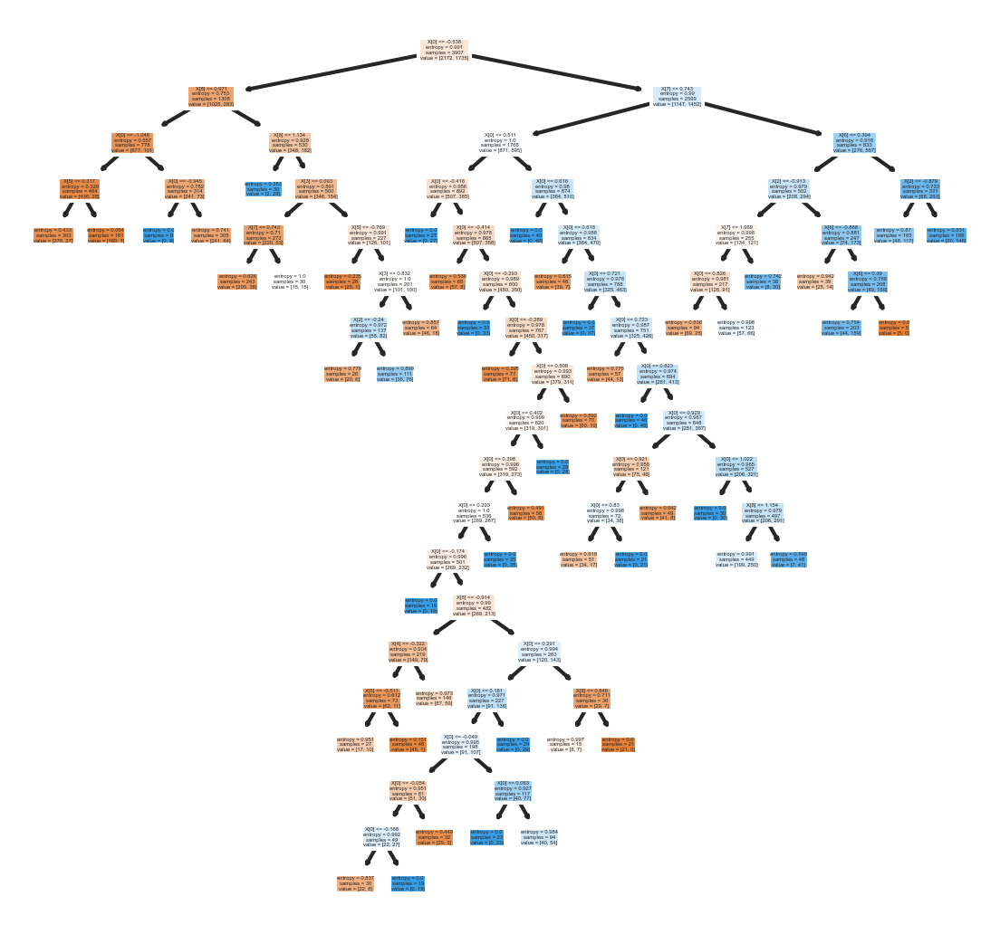

In [ ]:
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (4,4), dpi=300)
tree.plot_tree(decision_tree_model,filled=True)

[[1712  460]
 [ 372 1363]]


[Text(0, 0.5, 'No Risk'), Text(0, 1.5, 'At Risk')]

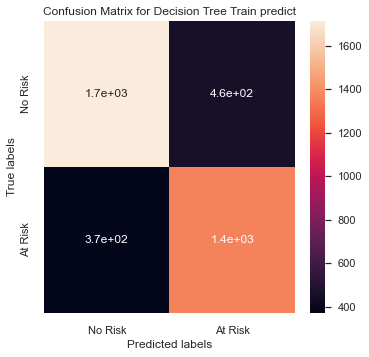

In [ ]:
#the confusion matrix for training
labels = ['No Risk', 'At Risk']
cm = confusion_matrix(y_train, train_preds)
print(cm)
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax) #annot=True to annotate cells
ax.set_xlabel('Predicted labels') 
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix for Decision Tree Train predict')
ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)

[[425 116]
 [105 331]]


[Text(0, 0.5, 'No Risk'), Text(0, 1.5, 'At Risk')]

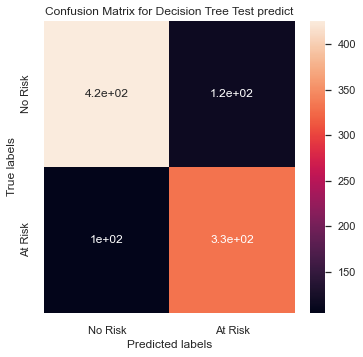

In [ ]:
#the confusion matrix for test data
labels = ['No Risk', 'At Risk']
cm = confusion_matrix(y_test, test_preds)
print(cm)
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax) #annot=True to annotate cells
# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix for Decision Tree Test predict')
ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)

In [ ]:
#classification report for train
print(classification_report(y_train, train_preds))

              precision    recall  f1-score   support

           0       0.82      0.79      0.80      2172
           1       0.75      0.79      0.77      1735

    accuracy                           0.79      3907
   macro avg       0.78      0.79      0.79      3907
weighted avg       0.79      0.79      0.79      3907



In [ ]:
#classification report for test
print(classification_report(y_test, test_preds))

              precision    recall  f1-score   support

           0       0.80      0.79      0.79       541
           1       0.74      0.76      0.75       436

    accuracy                           0.77       977
   macro avg       0.77      0.77      0.77       977
weighted avg       0.77      0.77      0.77       977



## Hyperparameter tunning - Decision tree

In [ ]:
# Necessary imports
from scipy.stats import randint
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
  
# Creating the hyperparameter grid 
param_dist = {'max_depth': [80, 90],
    'max_features': [2, 3],
    'min_samples_leaf': [3, 4],
    'min_samples_split': [8, 10],
              "criterion": ["gini", "entropy"]}
  
# Instantiating Decision Tree classifier
tree = DecisionTreeClassifier()
  
# Instantiating GridSearchCV object
tree_cv = GridSearchCV(tree, param_dist, cv = 5)
  
tree_cv.fit(X_train, y_train)
# Print the tuned parameters and score
print("Tuned Decision Tree Parameters: {}".format(tree_cv.best_params_))
print("Best score is {}".format(tree_cv.best_score_))


Tuned Decision Tree Parameters: {'criterion': 'entropy', 'max_depth': 80, 'max_features': 3, 'min_samples_leaf': 4, 'min_samples_split': 10}
Best score is 0.7343329916724246


In [ ]:
tree_pred = tree_cv.predict(X_test)
print(classification_report(y_test,tree_pred,digits=4))

              precision    recall  f1-score   support

           0     0.7612    0.8189    0.7890       541
           1     0.7519    0.6812    0.7148       436

    accuracy                         0.7574       977
   macro avg     0.7565    0.7500    0.7519       977
weighted avg     0.7570    0.7574    0.7559       977



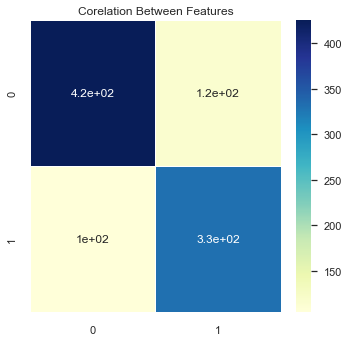

In [ ]:
conf_mat = confusion_matrix(y_test, test_preds)
plt.rcParams['figure.figsize'] = (5, 5) 
sns.heatmap(conf_mat, annot = True, linewidths=.5, cmap="YlGnBu")
plt.title('Corelation Between Features')
plt.show()

# AdaBoost Classification

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
#from sklearn.grid_search import GridSearchCV

param_grid_adb = {
    'n_estimators': [20, 50, 70, 100],
    'learning_rate' : [0.0001, 0.001, 0.01, 0.1, 0.2, 0.3],
    'n_estimators' : [100, 200, 300, 400, 500]
             }


#DTC = DecisionTreeClassifier(random_state = 11, max_features = "auto", class_weight = "auto",max_depth = None)

adb = AdaBoostClassifier()

# run grid search
adaboost_cv = GridSearchCV(adb, param_grid=param_grid_adb, cv = 5)
adaboost_cv.fit(X_train, y_train)
# Print the tuned parameters and score
print("Tuned Decision Tree Parameters: {}".format(adaboost_cv.best_params_))
print("Best score is {}".format(adaboost_cv.best_score_))

Tuned Decision Tree Parameters: {'learning_rate': 0.3, 'n_estimators': 500}
Best score is 0.7588929531618916


In [ ]:
adb_pred = adaboost_cv.predict(X_test)
print(classification_report(y_test,adb_pred,digits=4))

              precision    recall  f1-score   support

           0     0.7871    0.8133    0.8000       541
           1     0.7584    0.7271    0.7424       436

    accuracy                         0.7748       977
   macro avg     0.7727    0.7702    0.7712       977
weighted avg     0.7743    0.7748    0.7743       977



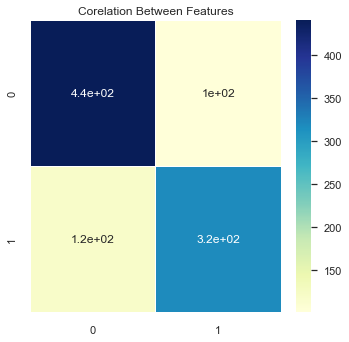

In [ ]:
conf_mat = confusion_matrix(y_test, adb_pred)
plt.rcParams['figure.figsize'] = (5, 5) 
sns.heatmap(conf_mat, annot = True, linewidths=.5, cmap="YlGnBu")
plt.title('Corelation Between Features')
plt.show()

# Naive Bayes Classifier

In [ ]:
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
gnb.fit(X_train, y_train)


GaussianNB()

In [ ]:
y_pred = gnb.predict(X_test)

In [ ]:
from sklearn import metrics
print('Gaussian Naive Bayes model accuracy:', metrics.accuracy_score(y_test, y_pred)*100)
print(classification_report(y_test, y_pred))

Gaussian Naive Bayes model accuracy: 66.53019447287615
              precision    recall  f1-score   support

           0       0.70      0.70      0.70       541
           1       0.62      0.63      0.63       436

    accuracy                           0.67       977
   macro avg       0.66      0.66      0.66       977
weighted avg       0.67      0.67      0.67       977



## hyperparameter tunnig Naive Bayes

In [ ]:
from sklearn.model_selection import RepeatedStratifiedKFold

cv_method = RepeatedStratifiedKFold(n_splits=5, 
                                    n_repeats=3, 
                                    random_state=999)

In [ ]:
from sklearn.preprocessing import PowerTransformer
params_NB = {'var_smoothing': np.logspace(0,-9, num=100)}

gs_NB = GridSearchCV(estimator=gnb, 
                     param_grid=params_NB, 
                     cv=cv_method,
                     verbose=1, 
                     scoring='accuracy')

Data_transformed = PowerTransformer().fit_transform(X_test)

gs_NB.fit(X_test, y_test);

Fitting 15 folds for each of 100 candidates, totalling 1500 fits


In [ ]:
gs_NB.best_params_

{'var_smoothing': 0.533669923120631}

In [ ]:
gs_NB.best_score_

0.662967032967033

In [ ]:
# predict the target on the test dataset
predict_test = gs_NB.predict(Data_transformed)

# Accuracy Score on test dataset
accuracy_test = accuracy_score(y_test,predict_test)
print('accuracy_score on test dataset : ', accuracy_test)

accuracy_score on test dataset :  0.6683725690890481


In [ ]:
print(classification_report(y_test,predict_test,digits=4))

              precision    recall  f1-score   support

           0     0.6848    0.7431    0.7128       541
           1     0.6436    0.5757    0.6077       436

    accuracy                         0.6684       977
   macro avg     0.6642    0.6594    0.6603       977
weighted avg     0.6664    0.6684    0.6659       977



# SVC

In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
 
# defining parameter range
param_grid_svm = {'C': [0.1, 1, 10, 100, 1000],
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf']}
svm = SVC()
svm_cv = GridSearchCV(svm, param_grid_svm, refit = True, verbose = 3)
 
# fitting the model for grid search
svm_cv.fit(X_train, y_train)

# Print the tuned parameters and score
print("Tuned Decision Tree Parameters: {}".format(svm_cv.best_params_))
print("Best score is {}".format(svm_cv.best_score_))

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.572 total time=   1.2s
[CV 2/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.563 total time=   1.5s
[CV 3/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.565 total time=   1.3s
[CV 4/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.571 total time=   1.2s
[CV 5/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.571 total time=   1.3s
[CV 1/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.694 total time=   1.0s
[CV 2/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.683 total time=   1.0s
[CV 3/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.671 total time=   1.0s
[CV 4/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.706 total time=   0.8s
[CV 5/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.685 total time=   1.2s
[CV 1/5] END .....C=0.1, gamma=0.01, kernel=rbf;, score=0.679 total time=   1.3s
[CV 2/5] END .....C=0.1, gamma=0.01, kernel=rbf

[CV 2/5] END .......C=1000, gamma=1, kernel=rbf;, score=0.861 total time=   1.2s
[CV 3/5] END .......C=1000, gamma=1, kernel=rbf;, score=0.868 total time=   1.4s
[CV 4/5] END .......C=1000, gamma=1, kernel=rbf;, score=0.853 total time=   1.1s
[CV 5/5] END .......C=1000, gamma=1, kernel=rbf;, score=0.853 total time=   1.4s
[CV 1/5] END .....C=1000, gamma=0.1, kernel=rbf;, score=0.834 total time=  10.2s
[CV 2/5] END .....C=1000, gamma=0.1, kernel=rbf;, score=0.797 total time=   9.8s
[CV 3/5] END .....C=1000, gamma=0.1, kernel=rbf;, score=0.817 total time=   9.2s
[CV 4/5] END .....C=1000, gamma=0.1, kernel=rbf;, score=0.802 total time=  10.3s
[CV 5/5] END .....C=1000, gamma=0.1, kernel=rbf;, score=0.798 total time=  10.2s
[CV 1/5] END ....C=1000, gamma=0.01, kernel=rbf;, score=0.721 total time=   3.6s
[CV 2/5] END ....C=1000, gamma=0.01, kernel=rbf;, score=0.706 total time=   3.6s
[CV 3/5] END ....C=1000, gamma=0.01, kernel=rbf;, score=0.697 total time=   3.7s
[CV 4/5] END ....C=1000, gam

In [ ]:
svm_pred = svm_cv.predict(X_test)
print(classification_report(y_test,svm_pred,digits=4))

              precision    recall  f1-score   support

           0     0.8805    0.8854    0.8829       541
           1     0.8568    0.8509    0.8539       436

    accuracy                         0.8700       977
   macro avg     0.8687    0.8682    0.8684       977
weighted avg     0.8699    0.8700    0.8700       977



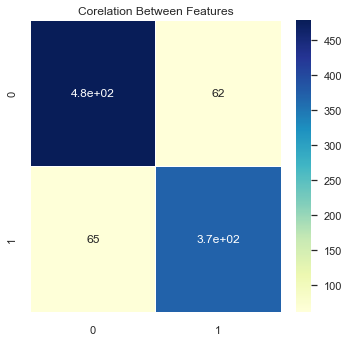

In [ ]:
conf_mat = confusion_matrix(y_test, svm_pred)
plt.rcParams['figure.figsize'] = (5, 5) 
sns.heatmap(conf_mat, annot = True, linewidths=.5, cmap="YlGnBu")
plt.title('Corelation Between Features')
plt.show()

## Evaluation Metric after hyper parameter tuning

In [ ]:

models = [['Adaboost', AdaBoostClassifier(random_state=42)],
          ['Adaboost after Hyperparameter Tuning',GridSearchCV(adb, param_grid=param_grid_adb, cv = 5)],
          ['Decision Tree', DecisionTreeClassifier()],
          ['Decision Tree after Hyperparameter Tuning',GridSearchCV(tree, param_dist, cv = 5)],
          ['KNN', KNeighborsClassifier(n_neighbors=79)],
          ['KNN after Hyperparameter tuning ', KNeighborsClassifier(n_neighbors=5)],
          ['Logistic Regression', LogisticRegression(solver='liblinear')],
          ['Logistic Regression after Hyperparameter Tuning',GridSearchCV(logreg, grid,cv = 5)],
          ['Naive Bayes', GaussianNB()],
          ['Naive Bayes after Hyperparameter tuning',
           GridSearchCV(estimator=gnb,
                        param_grid=params_NB,
                        cv=cv_method,
                        verbose=1, 
                        scoring='accuracy')],
          ['SVM', SVC(random_state=6)],
          ['SVM after Hyperparameter Tuning',GridSearchCV(svm, param_grid_svm, refit = True, verbose = 3)]
          ]






In [ ]:
from sklearn.metrics import classification_report, confusion_matrix,roc_auc_score,recall_score,accuracy_score,precision_score
model_1_data = []
for name,model in models :
    model_data = {}
    model_data["Name"] = name
    model.fit(X_train, y_train)
    predicted = model.predict(X_test)
    conf_mat = confusion_matrix(y_test, predicted)
    true_positive = conf_mat[0][0]
    false_positive = conf_mat[0][1]
    false_negative = conf_mat[1][0]
    true_negative = conf_mat[1][1]
    train_y_predicted = model.predict(X_train)
    test_y_predicted = model.predict(X_test)
    model_data['Train_accuracy'] = accuracy_score(y_train,train_y_predicted)
    model_data['Test_accuracy'] = accuracy_score(y_test,test_y_predicted)
    #model_data["Accuracy"] = accuracy_score(y_test,predicted)
    model_data['Precision'] = true_positive/(true_positive+false_positive)
    model_data['Recall']= true_positive/(true_positive+false_negative)
    model_data['F1_Score'] = 2*(model_data['Recall'] * model_data['Precision']) / (model_data['Recall'] + model_data['Precision'])
    model_1_data.append(model_data)

Fitting 15 folds for each of 100 candidates, totalling 1500 fits
Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.572 total time=   1.1s
[CV 2/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.563 total time=   1.2s
[CV 3/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.565 total time=   1.2s
[CV 4/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.571 total time=   1.2s
[CV 5/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.571 total time=   1.3s
[CV 1/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.694 total time=   1.0s
[CV 2/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.683 total time=   0.9s
[CV 3/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.671 total time=   0.8s
[CV 4/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.706 total time=   0.9s
[CV 5/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.685 total time=   1.0s
[CV 1/5] END .....C=0.1, gamma=0.01, kernel=rbf;, score=0.679 t

[CV 1/5] END .......C=1000, gamma=1, kernel=rbf;, score=0.885 total time=   1.2s
[CV 2/5] END .......C=1000, gamma=1, kernel=rbf;, score=0.861 total time=   1.3s
[CV 3/5] END .......C=1000, gamma=1, kernel=rbf;, score=0.868 total time=   1.5s
[CV 4/5] END .......C=1000, gamma=1, kernel=rbf;, score=0.853 total time=   1.4s
[CV 5/5] END .......C=1000, gamma=1, kernel=rbf;, score=0.853 total time=   1.3s
[CV 1/5] END .....C=1000, gamma=0.1, kernel=rbf;, score=0.834 total time=   9.4s
[CV 2/5] END .....C=1000, gamma=0.1, kernel=rbf;, score=0.797 total time=   8.1s
[CV 3/5] END .....C=1000, gamma=0.1, kernel=rbf;, score=0.817 total time=   7.7s
[CV 4/5] END .....C=1000, gamma=0.1, kernel=rbf;, score=0.802 total time=   8.1s
[CV 5/5] END .....C=1000, gamma=0.1, kernel=rbf;, score=0.798 total time=   8.2s
[CV 1/5] END ....C=1000, gamma=0.01, kernel=rbf;, score=0.721 total time=   3.5s
[CV 2/5] END ....C=1000, gamma=0.01, kernel=rbf;, score=0.706 total time=   3.6s
[CV 3/5] END ....C=1000, gam

In [ ]:
model_2_data = pd.DataFrame(model_1_data)
# model_1_data = model_1_data.sort_values('train_accuracy',ascending=False)
model_2_data

,Name,Train_accuracy,Test_accuracy,Precision,Recall,F1_Score
0,Adaboost,0.745073,0.748209,0.774492,0.771639,0.773063
1,Adaboost after Hyperparameter Tuning,0.775531,0.774821,0.813309,0.787120,0.800000
2,Decision Tree,1.000000,0.788127,0.792976,0.818702,0.805634
3,Decision Tree after Hyperparameter Tuning,0.900435,0.736950,0.767098,0.760073,0.763569
4,KNN,0.703097,0.684749,0.691312,0.726214,0.708333
5,KNN after Hyperparameter tuning,0.856412,0.775844,0.707948,0.862613,0.777665
6,Logistic Regression,0.673151,0.672467,0.726433,0.695575,0.710669
7,Logistic Regression after Hyperparameter Tuning,0.673919,0.671443,0.726433,0.694346,0.710027
8,Naive Bayes,0.658050,0.665302,0.696858,0.698148,0.697502
9,Naive Bayes after Hyperparameter tuning,0.664704,0.658137,0.720887,0.680628,0.700180


In [ ]:
classifiers = [GridSearchCV(adb, param_grid=param_grid_adb, cv = 5),GridSearchCV(tree, param_dist, cv = 5),
               KNeighborsClassifier(n_neighbors=5),
               GridSearchCV(logreg, grid, cv = 5),
               GridSearchCV(estimator=gnb,
                        param_grid=params_NB,
                        cv=cv_method,
                        verbose=1, 
                        scoring='accuracy'),
               GridSearchCV(svm, param_grid_svm, refit = True, verbose = 3)]
classifiers_names = ['Adaboost','Decision tree','KNN','Logistic Regression','Naive Bayes','SVM']
training,testing = [],[]
for i in classifiers:
    i.fit(X_train, y_train)
    train_y_predicted = i.predict(X_train)
    test_y_predicted = i.predict(X_test)
    tr = round(accuracy_score(y_train,train_y_predicted),4)
    ts = round(accuracy_score(y_test,test_y_predicted),4)
    training.append(tr)
    testing.append(ts)

Fitting 15 folds for each of 100 candidates, totalling 1500 fits
Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.572 total time=   1.1s
[CV 2/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.563 total time=   1.0s
[CV 3/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.565 total time=   1.2s
[CV 4/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.571 total time=   1.1s
[CV 5/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.571 total time=   1.2s
[CV 1/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.694 total time=   0.9s
[CV 2/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.683 total time=   0.9s
[CV 3/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.671 total time=   0.8s
[CV 4/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.706 total time=   0.8s
[CV 5/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.685 total time=   0.9s
[CV 1/5] END .....C=0.1, gamma=0.01, kernel=rbf;, score=0.679 t

[CV 1/5] END .......C=1000, gamma=1, kernel=rbf;, score=0.885 total time=   1.4s
[CV 2/5] END .......C=1000, gamma=1, kernel=rbf;, score=0.861 total time=   1.2s
[CV 3/5] END .......C=1000, gamma=1, kernel=rbf;, score=0.868 total time=   1.1s
[CV 4/5] END .......C=1000, gamma=1, kernel=rbf;, score=0.853 total time=   1.3s
[CV 5/5] END .......C=1000, gamma=1, kernel=rbf;, score=0.853 total time=   1.2s
[CV 1/5] END .....C=1000, gamma=0.1, kernel=rbf;, score=0.834 total time=   7.9s
[CV 2/5] END .....C=1000, gamma=0.1, kernel=rbf;, score=0.797 total time=   7.7s
[CV 3/5] END .....C=1000, gamma=0.1, kernel=rbf;, score=0.817 total time=   7.5s
[CV 4/5] END .....C=1000, gamma=0.1, kernel=rbf;, score=0.802 total time=   7.5s
[CV 5/5] END .....C=1000, gamma=0.1, kernel=rbf;, score=0.798 total time=   8.0s
[CV 1/5] END ....C=1000, gamma=0.01, kernel=rbf;, score=0.721 total time=   3.4s
[CV 2/5] END ....C=1000, gamma=0.01, kernel=rbf;, score=0.706 total time=   3.6s
[CV 3/5] END ....C=1000, gam

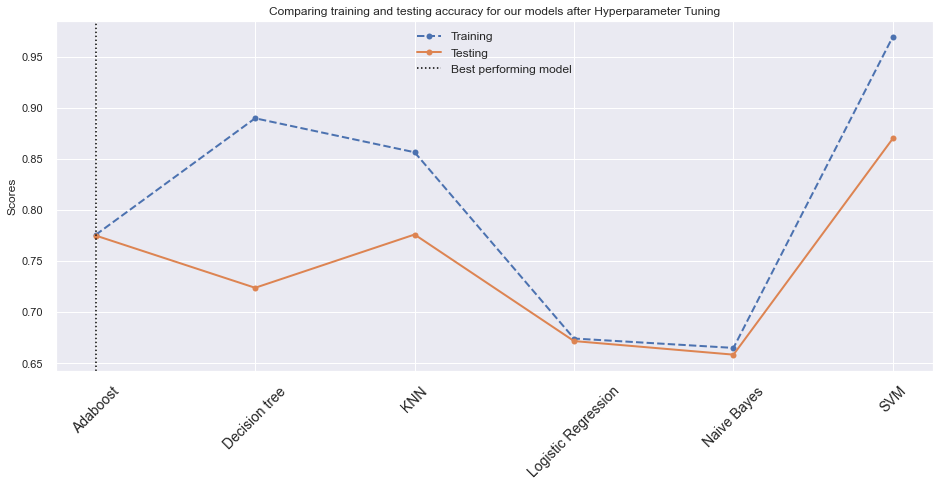

In [ ]:
diff = np.array(training)-np.array(testing)

plt.figure(figsize=(14,6))
plt.plot(range(0,len(classifiers)),training,'--o',lw=2,label='Training')
plt.plot(range(0,len(classifiers)),testing,'-o',lw=2,label='Testing')
plt.xticks(range(0,len(classifiers)), classifiers_names, rotation=45,fontsize=14)
plt.axvline(np.argmin(diff),linestyle=':', color='black', label=f'Best performing model')
plt.ylabel("Scores")
plt.title("Comparing training and testing accuracy for our models after Hyperparameter Tuning")
plt.grid(True)
plt.legend(loc='best',fontsize=12);


# Conclusion

We tried plotting all numerical variables with the dependent variables. From here we can conclude that,

●The major people who are having Cardiovascular Risk(CVR) are at the age of 50-70.

●The cholesterol level of people is the same for both kinds of people who are at risk of CVR and not at risk of CVR. Instead fewer people who are not at risk of CVR are having high Cholesterol levels.

●If we consider sysBP and diaBP together into consideration, then most of the people are having normal BP. So it's hard to conclude when you hear about the CVR.

●Even though many people have a normal range of BMI, the people who are having high BMI, they are at risk of CVR.

●Many people are having normal heart rate ranges, so it's not appropriate to come into conclusion about the CVR at this stage.

●In glucose level, we can see some outliers in both kinds of people(who are at risk and not at risk). But the people who got high glucose levels are coming into the category of CVR. So we can conclude that it's even one of the factors which may contribute to CVR.


We are plotting the graph for the dependent variable along with the categorical variables present in the dataset. We can conclude from here that,
●The people whoever already under the HyperTension, are at more risk of CVR
●But it's not the same in case of people who were under the attack of stroke once before. The people who never got the stroke are at high risk of CVR.
●Whether people smoke or not smoke, they are at risk of CVR.
●It's shocking to see that the people who never got any medication barely come under the risk of CVR. The people who are under BP medications are at high risk of CVR.

●When we compare males and females, males are at more risk of CVR.

●We can clearly see that, the people who had only basic education i.e., education 1 are at more risk of CVR. And it's gradually decreasing with the increase in education. It might be because the people who are educated are taking many precautions to avoid CVR.

We observe dependent variables with some of the features by doing bivariate and multivariate analysis.

●Even if they had diabetes or not, they are at the same level of risk of CVR. But it's high between the age group 50-70.

●We say that cholesterol and diabetes are related, but from the data, it's contrary to our assumption. Even though many people have very high levels of high cholesterol, they were not at risk of diabetes nor CVR. But if people have diabetes and cholesterol levels are high then they are at high risk of CVR.

●BP and heart rate has nothing to do with diabetes here. Many people who are at risk of CVR and diabetes are actually maintaining a normal range of BP and heart rate.

●If people are already having diabetes and if they have high BMI then they are at high risk of CVR.

### The accuracy of some models were increased after hyper parameter tuning, still Adaboost and naive bayes are the best performing models.
### Between those, if we compare Naive Bayes and Adaboost with accuracy and recall, Naive Bayes is the best performance model.